In [1]:
"""
Датасет: Liander 2024 Energy Forecasting Benchmark https://huggingface.co/datasets/OpenSTEF/liander2024-energy-forecasting-benchmark
Источник: OpenSTEF / Hugging Face (CC BY 4.0)
Период: 01.01.2024 – 31.12.2024
Разрешение: 15 минут

Компоненты:
- Измерения нагрузки по 55 станциям и 5 типам активов от DSO Liander
    mv_feeder (Фидеры среднего напряжения): отходящие кабели среднего напряжения от первичных подстанций
    station_installation (Станционные установки): различные установки первичных подстанций
    transformer (Трансформаторы): силовые трансформаторы на первичных подстанциях
    solar_park (Солнечные парки): обезличенные и нормализованные индивидуальные измерения солнечных парков
    wind_park (Ветровые парки): обезличенные и нормализованные индивидуальные измерения ветряных парков

- Погода (10 признаков) от OpenMeteo
- Цены EPEX (Евро/МВт-ч) от ENTSO-E
- 15 профилей потребления от Energiedatawijzer

Задача:
- Прогнозирование электрической нагрузки (активной мощности, МВт) на 43 точках инфраструктуры Liander по фидерам среднего напряжения, трансформаторам и станционным установкам
"""

'\nДатасет: Liander 2024 Energy Forecasting Benchmark https://huggingface.co/datasets/OpenSTEF/liander2024-energy-forecasting-benchmark\nИсточник: OpenSTEF / Hugging Face (CC BY 4.0)\nПериод: 01.01.2024 – 31.12.2024\nРазрешение: 15 минут\n\nКомпоненты:\n- Измерения нагрузки по 55 станциям и 5 типам активов от DSO Liander\n    mv_feeder (Фидеры среднего напряжения): отходящие кабели среднего напряжения от первичных подстанций\n    station_installation (Станционные установки): различные установки первичных подстанций\n    transformer (Трансформаторы): силовые трансформаторы на первичных подстанциях\n    solar_park (Солнечные парки): обезличенные и нормализованные индивидуальные измерения солнечных парков\n    wind_park (Ветровые парки): обезличенные и нормализованные индивидуальные измерения ветряных парков\n\n- Погода (10 признаков) от OpenMeteo\n- Цены EPEX (Евро/МВт-ч) от ENTSO-E\n- 15 профилей потребления от Energiedatawijzer\n\nЗадача:\n- Прогнозирование электрической нагрузки (акти

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import yaml
import datetime
from huggingface_hub import hf_hub_download

# Load data

In [3]:
REPO_ID = "OpenSTEF/liander2024-energy-forecasting-benchmark"

targets_path = hf_hub_download(REPO_ID, "liander2024_targets.yaml", repo_type="dataset")
with open(targets_path, 'r', encoding='utf-8') as f:
    targets = yaml.safe_load(f)

stations = [(item['name'], item['group_name']) for item in targets]

epex_df = pd.read_parquet(hf_hub_download(REPO_ID, "EPEX.parquet", repo_type="dataset"))[['timestamp', 'EPEX_NL']]
profiles_df = pd.read_parquet(hf_hub_download(REPO_ID, "profiles.parquet", repo_type="dataset"))

all_dfs = []

for station_name, group_name in stations:
    try:
        load_path = hf_hub_download(
            REPO_ID,
            f"load_measurements/{group_name}/{station_name}.parquet",
            repo_type="dataset"
        )
        load_df = pd.read_parquet(load_path)[['timestamp', 'load']]
        load_df['station'] = station_name
        load_df['group'] = group_name

        weather_path = hf_hub_download(
            REPO_ID,
            f"weather_measurements/{group_name}/{station_name}.parquet",
            repo_type="dataset"
        )
        weather_df = pd.read_parquet(weather_path)

        merged = pd.merge(load_df, weather_df, on='timestamp', how='inner')

        merged = pd.merge(merged, epex_df, on='timestamp', how='left')
        merged = pd.merge(merged, profiles_df, on='timestamp', how='left')

        all_dfs.append(merged)

    except Exception as e:
        print('exception')
        continue

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


liander2024_targets.yaml: 0.00B [00:00, ?B/s]

EPEX.parquet:   0%|          | 0.00/409k [00:00<?, ?B/s]

profiles.parquet:   0%|          | 0.00/1.92M [00:00<?, ?B/s]

load_measurements/wind_park/Within Stads(…):   0%|          | 0.00/727k [00:00<?, ?B/s]

weather_measurements/wind_park/Within St(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/wind_park/Within 15 ki(…):   0%|          | 0.00/736k [00:00<?, ?B/s]

weather_measurements/wind_park/Within 15(…):   0%|          | 0.00/1.28M [00:00<?, ?B/s]

load_measurements/wind_park/Within 20 ki(…):   0%|          | 0.00/714k [00:00<?, ?B/s]

weather_measurements/wind_park/Within 20(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/wind_park/Within 15 ki(…):   0%|          | 0.00/734k [00:00<?, ?B/s]

weather_measurements/wind_park/Within 15(…):   0%|          | 0.00/1.38M [00:00<?, ?B/s]

load_measurements/wind_park/Within 15 ki(…):   0%|          | 0.00/738k [00:00<?, ?B/s]

weather_measurements/wind_park/Within 15(…):   0%|          | 0.00/1.39M [00:00<?, ?B/s]

load_measurements/transformer/OS Apeldoo(…):   0%|          | 0.00/745k [00:00<?, ?B/s]

weather_measurements/transformer/OS Apel(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/transformer/OS Middenm(…):   0%|          | 0.00/788k [00:00<?, ?B/s]

weather_measurements/transformer/OS Midd(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/transformer/RS Grouw ((…):   0%|          | 0.00/721k [00:00<?, ?B/s]

weather_measurements/transformer/RS Grou(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/transformer/RS Wiering(…):   0%|          | 0.00/727k [00:00<?, ?B/s]

weather_measurements/transformer/RS Wier(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/transformer/OS Lelysta(…):   0%|          | 0.00/741k [00:00<?, ?B/s]

weather_measurements/transformer/OS Lely(…):   0%|          | 0.00/1.39M [00:00<?, ?B/s]

load_measurements/transformer/RS Poedero(…):   0%|          | 0.00/726k [00:00<?, ?B/s]

weather_measurements/transformer/RS Poed(…):   0%|          | 0.00/1.27M [00:00<?, ?B/s]

load_measurements/transformer/OS Tiel.pa(…):   0%|          | 0.00/771k [00:00<?, ?B/s]

weather_measurements/transformer/OS Tiel(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/transformer/OS Doetinc(…):   0%|          | 0.00/773k [00:00<?, ?B/s]

weather_measurements/transformer/OS Doet(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/transformer/OS Oterlee(…):   0%|          | 0.00/816k [00:00<?, ?B/s]

weather_measurements/transformer/OS Oter(…):   0%|          | 0.00/1.28M [00:00<?, ?B/s]

load_measurements/transformer/OS Nijmege(…):   0%|          | 0.00/776k [00:00<?, ?B/s]

weather_measurements/transformer/OS Nijm(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/transformer/OS Amsterd(…):   0%|          | 0.00/790k [00:00<?, ?B/s]

weather_measurements/transformer/OS Amst(…):   0%|          | 0.00/1.38M [00:00<?, ?B/s]

load_measurements/transformer/RS Surhuis(…):   0%|          | 0.00/730k [00:00<?, ?B/s]

weather_measurements/transformer/RS Surh(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/transformer/OS Ede.par(…):   0%|          | 0.00/756k [00:00<?, ?B/s]

weather_measurements/transformer/OS Ede.(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/transformer/RS Roodwil(…):   0%|          | 0.00/746k [00:00<?, ?B/s]

weather_measurements/transformer/RS Rood(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/transformer/RS Minnert(…):   0%|          | 0.00/721k [00:00<?, ?B/s]

weather_measurements/transformer/RS Minn(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/mv_feeder/OS Naarden.p(…):   0%|          | 0.00/708k [00:00<?, ?B/s]

weather_measurements/mv_feeder/OS Naarde(…):   0%|          | 0.00/1.38M [00:00<?, ?B/s]

load_measurements/mv_feeder/OS Leiden No(…):   0%|          | 0.00/701k [00:00<?, ?B/s]

weather_measurements/mv_feeder/OS Leiden(…):   0%|          | 0.00/1.39M [00:00<?, ?B/s]

load_measurements/mv_feeder/SS Harlingen(…):   0%|          | 0.00/698k [00:00<?, ?B/s]

weather_measurements/mv_feeder/SS Harlin(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/mv_feeder/OS Eibergen.(…):   0%|          | 0.00/709k [00:00<?, ?B/s]

weather_measurements/mv_feeder/OS Eiberg(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/mv_feeder/OS Sneek.par(…):   0%|          | 0.00/698k [00:00<?, ?B/s]

weather_measurements/mv_feeder/OS Sneek.(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/mv_feeder/OS Weesp.par(…):   0%|          | 0.00/708k [00:00<?, ?B/s]

weather_measurements/mv_feeder/OS Weesp.(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/mv_feeder/SS Ureterp.p(…):   0%|          | 0.00/697k [00:00<?, ?B/s]

weather_measurements/mv_feeder/SS Ureter(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/mv_feeder/OS Gorredijk(…):   0%|          | 0.00/700k [00:00<?, ?B/s]

weather_measurements/mv_feeder/OS Gorred(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/mv_feeder/OS Sassenhei(…):   0%|          | 0.00/711k [00:00<?, ?B/s]

weather_measurements/mv_feeder/OS Sassen(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/mv_feeder/OS Waarderpo(…):   0%|          | 0.00/700k [00:00<?, ?B/s]

weather_measurements/mv_feeder/OS Waarde(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/mv_feeder/OS Edam.parq(…):   0%|          | 0.00/700k [00:00<?, ?B/s]

weather_measurements/mv_feeder/OS Edam.p(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/mv_feeder/OS Watergraa(…):   0%|          | 0.00/699k [00:00<?, ?B/s]

weather_measurements/mv_feeder/OS Waterg(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/mv_feeder/RS Angerlo.p(…):   0%|          | 0.00/711k [00:00<?, ?B/s]

weather_measurements/mv_feeder/RS Angerl(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/mv_feeder/SS Heerenvee(…):   0%|          | 0.00/708k [00:00<?, ?B/s]

weather_measurements/mv_feeder/SS Heeren(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/mv_feeder/RS Roodwilli(…):   0%|          | 0.00/708k [00:00<?, ?B/s]

load_measurements/solar_park/Within 5 ki(…):   0%|          | 0.00/690k [00:00<?, ?B/s]

weather_measurements/solar_park/Within 5(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/solar_park/Within 15 k(…):   0%|          | 0.00/704k [00:00<?, ?B/s]

weather_measurements/solar_park/Within 1(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/solar_park/Within 15 k(…):   0%|          | 0.00/706k [00:00<?, ?B/s]

weather_measurements/solar_park/Within 1(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/solar_park/Within 20 k(…):   0%|          | 0.00/704k [00:00<?, ?B/s]

weather_measurements/solar_park/Within 2(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/solar_park/Within 10 k(…):   0%|          | 0.00/708k [00:00<?, ?B/s]

weather_measurements/solar_park/Within 1(…):   0%|          | 0.00/1.28M [00:00<?, ?B/s]

load_measurements/station_installation/O(…):   0%|          | 0.00/745k [00:00<?, ?B/s]

load_measurements/station_installation/R(…):   0%|          | 0.00/733k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/station_installation/O(…):   0%|          | 0.00/778k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.37M [00:00<?, ?B/s]

load_measurements/station_installation/S(…):   0%|          | 0.00/713k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/station_installation/O(…):   0%|          | 0.00/779k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.28M [00:00<?, ?B/s]

load_measurements/station_installation/O(…):   0%|          | 0.00/749k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/station_installation/O(…):   0%|          | 0.00/789k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/station_installation/R(…):   0%|          | 0.00/743k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/station_installation/S(…):   0%|          | 0.00/721k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/station_installation/O(…):   0%|          | 0.00/787k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/station_installation/O(…):   0%|          | 0.00/785k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

load_measurements/station_installation/O(…):   0%|          | 0.00/740k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.42M [00:00<?, ?B/s]

load_measurements/station_installation/R(…):   0%|          | 0.00/728k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/station_installation/R(…):   0%|          | 0.00/747k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.41M [00:00<?, ?B/s]

load_measurements/station_installation/O(…):   0%|          | 0.00/793k [00:00<?, ?B/s]

weather_measurements/station_installatio(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

# EDA

In [4]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', None)

In [5]:
df = pd.concat(all_dfs, ignore_index=True)
df.drop(columns=['available_at'], inplace=True)
df.head()

,timestamp,load,station,group,temperature_2m,relative_humidity_2m,surface_pressure,cloud_cover,wind_speed_10m,wind_direction_10m,shortwave_radiation,direct_radiation,diffuse_radiation,direct_normal_irradiance,EPEX_NL,E1A_AZI_A,E1A_AMI_A,E1B_AZI_A,E1B_AMI_A,E1C_AZI_A,E1C_AMI_A,E2A_AZI_A,E2A_AMI_A,E2B_AZI_A,E2B_AMI_A,E3A_A,E3B_A,E3C_A,E3D_A,E4A_A
0,2024-01-01 00:00:00+00:00,-0.951386,Within Stadsregio Arnhem Nijmegen_normalized,wind_park,8.402000,71.277458,996.411499,100.0,30.190672,210.846512,0.0,0.0,0.0,0.0,0.01,0.000030,0.000040,0.000062,0.000078,0.000057,0.000064,0.000024,0.000034,0.000053,0.000064,0.000058,0.000058,0.000058,0.000058,0.000079
1,2024-01-01 00:15:00+00:00,-0.918124,Within Stadsregio Arnhem Nijmegen_normalized,wind_park,8.189501,73.220047,996.510498,100.0,29.932449,211.361191,0.0,0.0,0.0,0.0,0.01,0.000029,0.000039,0.000061,0.000075,0.000056,0.000061,0.000024,0.000034,0.000052,0.000063,0.000058,0.000058,0.000058,0.000058,0.000079
2,2024-01-01 00:30:00+00:00,-0.944136,Within Stadsregio Arnhem Nijmegen_normalized,wind_park,7.977000,75.162643,996.609558,100.0,29.674225,211.875885,0.0,0.0,0.0,0.0,0.01,0.000028,0.000038,0.000058,0.000073,0.000055,0.000060,0.000023,0.000033,0.000051,0.000063,0.000058,0.000058,0.000058,0.000058,0.000079
3,2024-01-01 00:45:00+00:00,-0.950959,Within Stadsregio Arnhem Nijmegen_normalized,wind_park,7.764500,77.105232,996.708618,100.0,29.416002,212.390564,0.0,0.0,0.0,0.0,0.01,0.000027,0.000036,0.000057,0.000071,0.000052,0.000057,0.000023,0.000032,0.000051,0.000061,0.000059,0.000059,0.000059,0.000059,0.000079
4,2024-01-01 01:00:00+00:00,-0.965885,Within Stadsregio Arnhem Nijmegen_normalized,wind_park,7.552000,79.047821,996.807617,100.0,29.157780,212.905243,0.0,0.0,0.0,0.0,0.00,0.000027,0.000034,0.000057,0.000067,0.000050,0.000055,0.000024,0.000032,0.000052,0.000060,0.000057,0.000057,0.000057,0.000057,0.000079


In [6]:
df['load'].describe()

,load
count,1.915838e+06
mean,-1.773083e+06
std,1.183926e+07
min,-8.222000e+07
25%,-2.703333e+06
50%,0.000000e+00
75%,1.353333e+06
max,7.532000e+07


In [7]:
CONSUMPTION_GROUPS = ['transformer', 'mv_feeder', 'station_installation']
df = df[df['group'].isin(CONSUMPTION_GROUPS)].copy()

In [8]:
df.shape

(1581120, 30)

## Пропуски

In [9]:
missing = df.isnull().sum()
missing[missing > 0]

,0
load,16612


In [10]:
nan_rows = df[df['load'].isnull()]
days_with_nan = nan_rows['timestamp'].dt.tz_localize(None).dt.date
unique_days_with_nan = sorted(days_with_nan.unique())

print(len(unique_days_with_nan))
print(unique_days_with_nan)

60
[datetime.date(2024, 1, 1), datetime.date(2024, 1, 2), datetime.date(2024, 1, 3), datetime.date(2024, 1, 4), datetime.date(2024, 1, 5), datetime.date(2024, 1, 6), datetime.date(2024, 1, 7), datetime.date(2024, 1, 8), datetime.date(2024, 1, 9), datetime.date(2024, 1, 10), datetime.date(2024, 1, 11), datetime.date(2024, 1, 12), datetime.date(2024, 1, 13), datetime.date(2024, 1, 14), datetime.date(2024, 1, 15), datetime.date(2024, 1, 16), datetime.date(2024, 1, 17), datetime.date(2024, 1, 18), datetime.date(2024, 1, 19), datetime.date(2024, 1, 20), datetime.date(2024, 1, 21), datetime.date(2024, 1, 22), datetime.date(2024, 1, 23), datetime.date(2024, 1, 24), datetime.date(2024, 1, 25), datetime.date(2024, 1, 26), datetime.date(2024, 1, 27), datetime.date(2024, 1, 28), datetime.date(2024, 1, 29), datetime.date(2024, 1, 30), datetime.date(2024, 1, 31), datetime.date(2024, 2, 1), datetime.date(2024, 2, 2), datetime.date(2024, 2, 3), datetime.date(2024, 2, 4), datetime.date(2024, 2, 5), da

In [11]:
df.sort_values('timestamp', inplace=True)
oct27_date = pd.Timestamp('2024-10-27').date()
is_oct27 = df['timestamp'].dt.date == oct27_date

load_orig = df['load'].copy()
oct27_subset = df[is_oct27].copy()

oct27_subset['load'] = oct27_subset.groupby(['station', 'group'])['load'].transform(
    lambda x: x.interpolate(method='linear')
)

df.loc[is_oct27, 'load'] = oct27_subset['load'].values

df.dropna(subset=['load'], inplace=True)

27.10.2024 Нидерланды перешли на зимнее время, из-за чего образовались пропуски на 45 минут. Были заполнены линейной интерполяцией. Остальные пропуски принадлежали 5 станциям в категории station_installation в период с 01.01 по 28.02. Они были удалены из-за невозможности заполнения

In [12]:
assert df['load'].isna().sum().sum() == 0

## Распределения

In [13]:
df['group'].value_counts()

,count
group,
transformer,527040
mv_feeder,527040
station_installation,510563


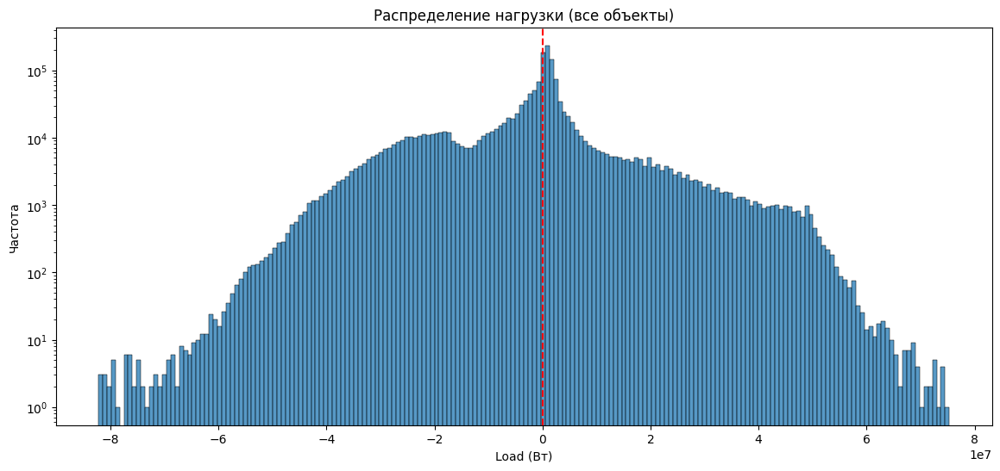

In [14]:
plt.figure(figsize=(14, 6))
sns.histplot(df['load'], bins=200, kde=False)
plt.title('Распределение нагрузки (все объекты)')
plt.xlabel('Load (Вт)')
plt.ylabel('Частота')
plt.yscale('log')
plt.axvline(0, color='red', linestyle='--')
plt.show()

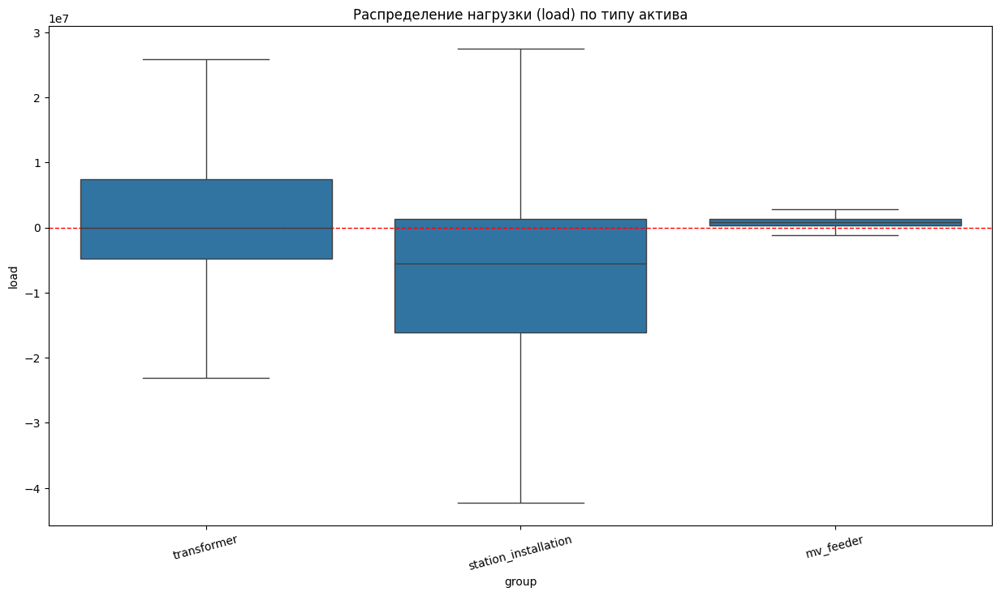


Доля отрицательных значений по типам активов
group
mv_feeder               0.126224
station_installation    0.698313
transformer             0.495830
Name: load, dtype: float64


In [15]:
plt.figure(figsize=(15, 8))
sns.boxplot(data=df, x='group', y='load', showfliers=False)
plt.title('Распределение нагрузки (load) по типу актива')
plt.xticks(rotation=15)
plt.axhline(0, color='red', linestyle='--', linewidth=1)
plt.show()

neg_ratio = df.groupby('group')['load'].apply(lambda x: (x < 0).mean())
print("\nДоля отрицательных значений по типам активов")
print(neg_ratio)

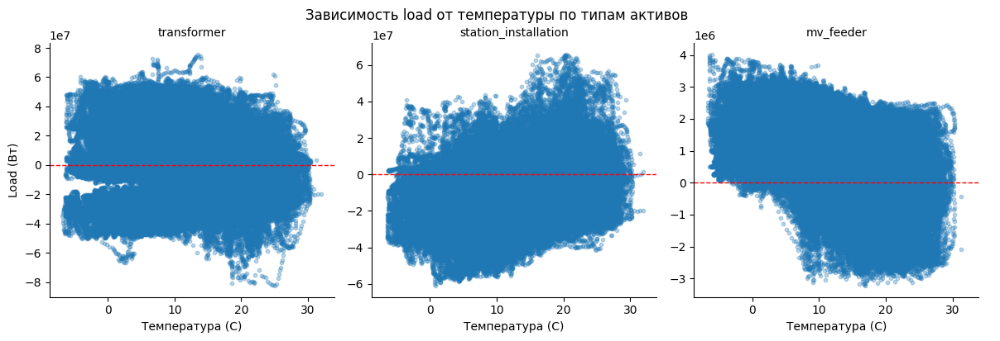

In [16]:
g = sns.FacetGrid(df, col='group', col_wrap=3, sharey=False, height=4)
g.map(plt.scatter, 'temperature_2m', 'load', alpha=0.3, s=10)
g.add_legend()
g.set_titles('{col_name}')
g.set_axis_labels('Температура (C)', 'Load (Вт)')
for ax in g.axes.flat:
    ax.axhline(0, color='red', linestyle='--', linewidth=1)
plt.suptitle('Зависимость load от температуры по типам активов', y=1.02)
plt.show()

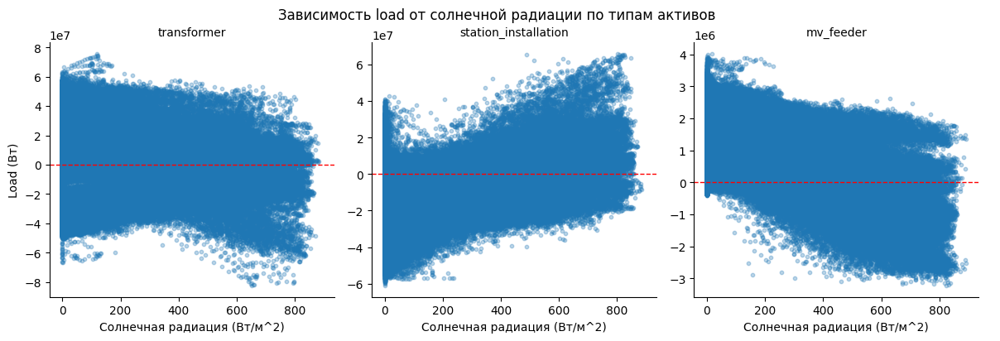

In [17]:
g = sns.FacetGrid(df, col='group', col_wrap=3, sharey=False, height=4)
g.map(plt.scatter, 'shortwave_radiation', 'load', alpha=0.3, s=10)
g.add_legend()
g.set_titles('{col_name}')
g.set_axis_labels('Солнечная радиация (Вт/м^2)', 'Load (Вт)')
for ax in g.axes.flat:
    ax.axhline(0, color='red', linestyle='--', linewidth=1)
plt.suptitle('Зависимость load от солнечной радиации по типам активов', y=1.02)
plt.show()

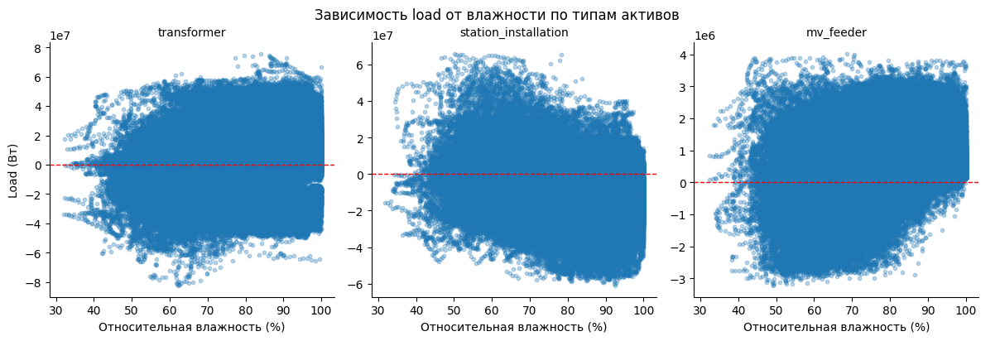

In [18]:
g = sns.FacetGrid(df, col='group', col_wrap=3, sharey=False, height=4)
g.map(plt.scatter, 'relative_humidity_2m', 'load', alpha=0.3, s=10)
g.add_legend()
g.set_titles('{col_name}')
g.set_axis_labels('Относительная влажность (%)', 'Load (Вт)')
for ax in g.axes.flat:
    ax.axhline(0, color='red', linestyle='--', linewidth=1)
plt.suptitle('Зависимость load от влажности по типам активов', y=1.02)
plt.show()

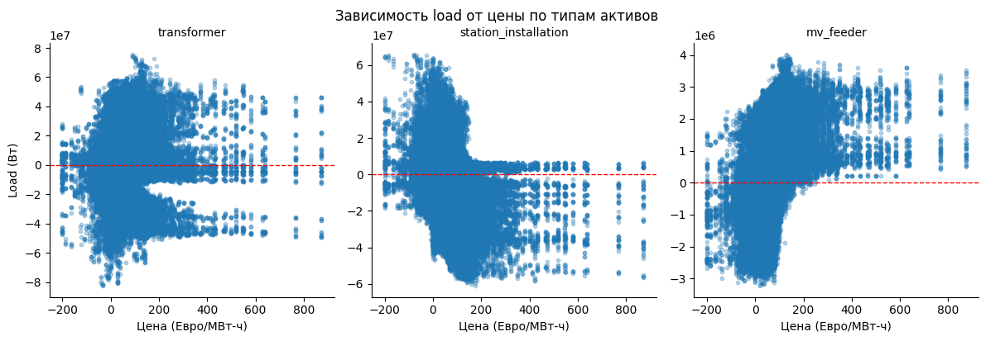

In [19]:
g = sns.FacetGrid(df, col='group', col_wrap=3, sharey=False, height=4)
g.map(plt.scatter, 'EPEX_NL', 'load', alpha=0.3, s=10)
g.add_legend()
g.set_titles('{col_name}')
g.set_axis_labels('Цена (Евро/МВт-ч)', 'Load (Вт)')
for ax in g.axes.flat:
    ax.axhline(0, color='red', linestyle='--', linewidth=1)
plt.suptitle('Зависимость load от цены по типам активов', y=1.02)
plt.show()

In [20]:
df['hour'] = df['timestamp'].dt.hour
df['day'] = df['timestamp'].dt.day
df['month'] = df['timestamp'].dt.month
df['weekday'] = df['timestamp'].dt.weekday
df['is_weekend'] = df['weekday'].isin([5, 6])

In [21]:
df['season'] = df['month'].map({
    12: 0, 1: 0, 2: 0,
    3: 1, 4: 1, 5: 1,
    6: 2, 7: 2, 8: 2,
    9: 3, 10: 3, 11: 3
})

In [22]:
import holidays

years = range(df['timestamp'].dt.year.min(), df['timestamp'].dt.year.max() + 1)
nl_holidays = holidays.NL(years=years)
holiday_dates = set(nl_holidays.keys())

df['is_holiday'] = df['timestamp'].dt.date.isin(holiday_dates)

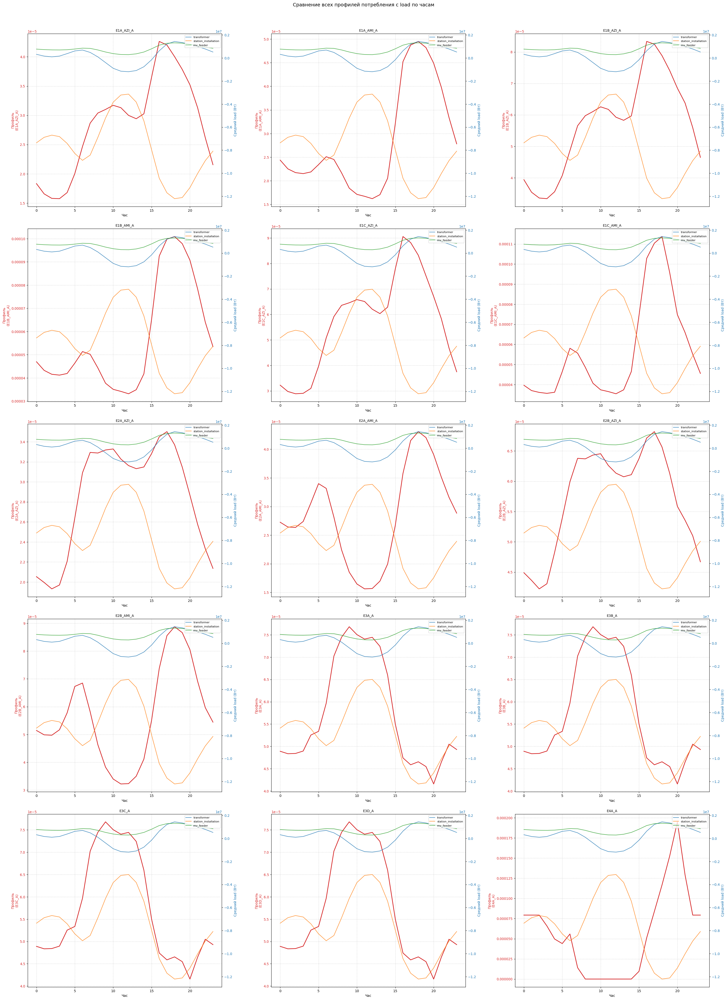

In [23]:
profile_cols = [
    'E1A_AZI_A', 'E1A_AMI_A', 'E1B_AZI_A', 'E1B_AMI_A', 'E1C_AZI_A',
    'E1C_AMI_A', 'E2A_AZI_A', 'E2A_AMI_A', 'E2B_AZI_A', 'E2B_AMI_A',
    'E3A_A', 'E3B_A', 'E3C_A', 'E3D_A', 'E4A_A'
]

hourly_load = df.groupby(['group', 'hour'])['load'].mean().reset_index()

n_profiles = len(profile_cols)
cols = 3
rows = (n_profiles + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(10 * cols, 8 * rows))
axes = axes.flatten() if n_profiles > 1 else [axes]

for i, profile_col in enumerate(profile_cols):
    ax1 = axes[i]
    hourly_profile = df.groupby('hour')[profile_col].mean()

    color = 'tab:red'
    ax1.set_xlabel('Час')
    ax1.set_ylabel(f'Профиль\n({profile_col})', color=color)
    ax1.plot(hourly_profile.index, hourly_profile.values, color=color, linewidth=2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('Средний load (Вт)', color=color)

    for group in df.group.unique():
        subset = hourly_load[hourly_load['group'] == group]
        if not subset.empty:
            ax2.plot(subset['hour'], subset['load'], label=group, alpha=0.8)

    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right', fontsize=8)
    ax1.set_title(f'{profile_col}', fontsize=10)
    ax1.grid(True, linestyle='--', alpha=0.5)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(pad=2.0)
plt.suptitle('Сравнение всех профилей потребления с load по часам', y=1.02, fontsize=14)
plt.show()

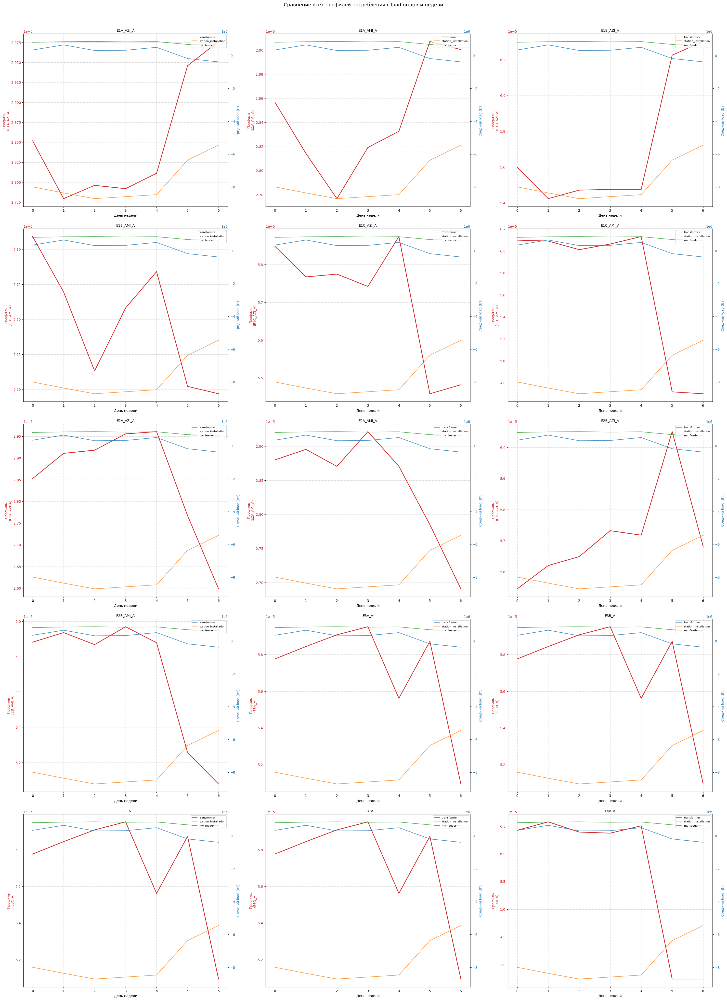

In [24]:
profile_cols = [
    'E1A_AZI_A', 'E1A_AMI_A', 'E1B_AZI_A', 'E1B_AMI_A', 'E1C_AZI_A',
    'E1C_AMI_A', 'E2A_AZI_A', 'E2A_AMI_A', 'E2B_AZI_A', 'E2B_AMI_A',
    'E3A_A', 'E3B_A', 'E3C_A', 'E3D_A', 'E4A_A'
]

weekday_load = df.groupby(['group', 'weekday'])['load'].mean().reset_index()

n_profiles = len(profile_cols)
cols = 3
rows = (n_profiles + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(10 * cols, 8 * rows))
axes = axes.flatten() if n_profiles > 1 else [axes]

for i, profile_col in enumerate(profile_cols):
    ax1 = axes[i]
    weekday_profile = df.groupby('weekday')[profile_col].mean()

    color = 'tab:red'
    ax1.set_xlabel('День недели')
    ax1.set_ylabel(f'Профиль\n({profile_col})', color=color)
    ax1.plot(weekday_profile.index, weekday_profile.values, color=color, linewidth=2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('Средний load (Вт)', color=color)

    for group in df.group.unique():
        subset = weekday_load[weekday_load['group'] == group]
        if not subset.empty:
            ax2.plot(subset['weekday'], subset['load'], label=group, alpha=0.8)

    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right', fontsize=8)
    ax1.set_title(f'{profile_col}', fontsize=10)
    ax1.grid(True, linestyle='--', alpha=0.5)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(pad=2.0)
plt.suptitle('Сравнение всех профилей потребления с load по дням недели', y=1.02, fontsize=14)
plt.show()

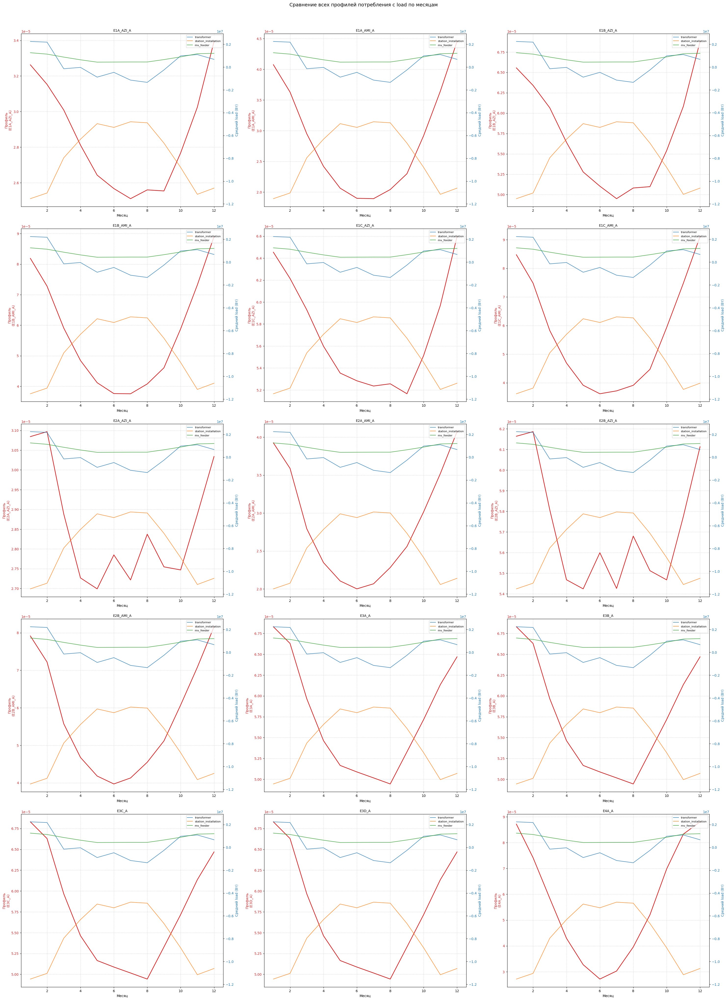

In [25]:
profile_cols = [
    'E1A_AZI_A', 'E1A_AMI_A', 'E1B_AZI_A', 'E1B_AMI_A', 'E1C_AZI_A',
    'E1C_AMI_A', 'E2A_AZI_A', 'E2A_AMI_A', 'E2B_AZI_A', 'E2B_AMI_A',
    'E3A_A', 'E3B_A', 'E3C_A', 'E3D_A', 'E4A_A'
]

monthly_load = df.groupby(['group', 'month'])['load'].mean().reset_index()

n_profiles = len(profile_cols)
cols = 3
rows = (n_profiles + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(10 * cols, 8 * rows))
axes = axes.flatten() if n_profiles > 1 else [axes]

for i, profile_col in enumerate(profile_cols):
    ax1 = axes[i]
    month_profile = df.groupby('month')[profile_col].mean()

    color = 'tab:red'
    ax1.set_xlabel('Месяц')
    ax1.set_ylabel(f'Профиль\n({profile_col})', color=color)
    ax1.plot(month_profile.index, month_profile.values, color=color, linewidth=2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('Средний load (Вт)', color=color)

    for group in df.group.unique():
        subset = monthly_load[monthly_load['group'] == group]
        if not subset.empty:
            ax2.plot(subset['month'], subset['load'], label=group, alpha=0.8)

    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right', fontsize=8)
    ax1.set_title(f'{profile_col}', fontsize=10)
    ax1.grid(True, linestyle='--', alpha=0.5)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(pad=2.0)
plt.suptitle('Сравнение всех профилей потребления с load по месяцам', y=1.02, fontsize=14)
plt.show()

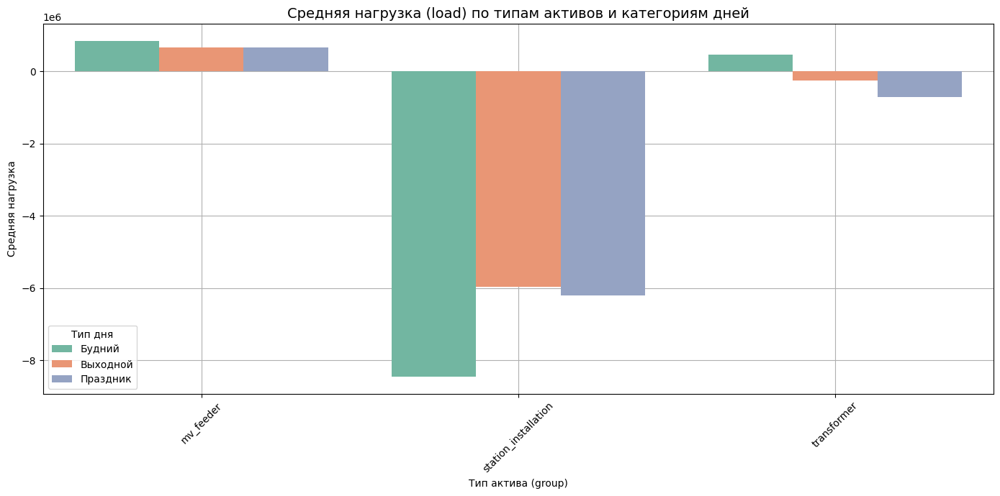

In [26]:
df['day_category'] = np.where(
    df['is_holiday'], 'Праздник',
    np.where(df['is_weekend'], 'Выходной', 'Будний')
)

summary = df.groupby(['group', 'day_category'])['load'].agg(
    mean_load='mean',
    median_load='median',
    count='size'
).reset_index()

category_order = ['Будний', 'Выходной', 'Праздник']
summary['day_category'] = pd.Categorical(
    summary['day_category'],
    categories=category_order,
    ordered=True
)
summary = summary.sort_values(['group', 'day_category'])

plt.figure(figsize=(14, 7))
sns.barplot(
    data=summary,
    x='group',
    y='mean_load',
    hue='day_category',
    hue_order=category_order,
    palette='Set2',
    zorder=3
)
plt.title('Средняя нагрузка (load) по типам активов и категориям дней', fontsize=14)
plt.ylabel('Средняя нагрузка')
plt.xlabel('Тип актива (group)')
plt.legend(title='Тип дня')
plt.xticks(rotation=45)
plt.grid(zorder=0)
plt.tight_layout()
plt.show()

<Axes: xlabel='group', ylabel='load'>

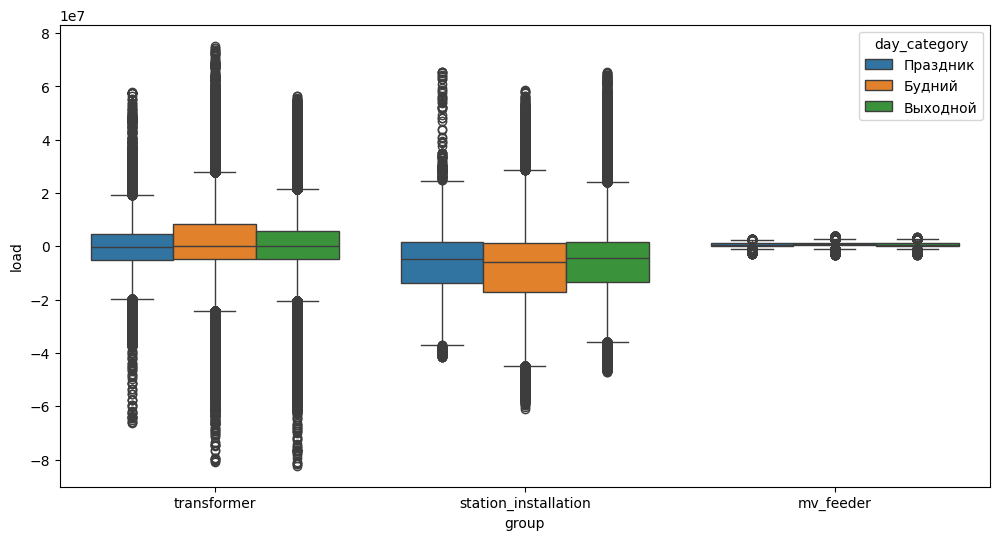

In [27]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='group', y='load', hue='day_category')

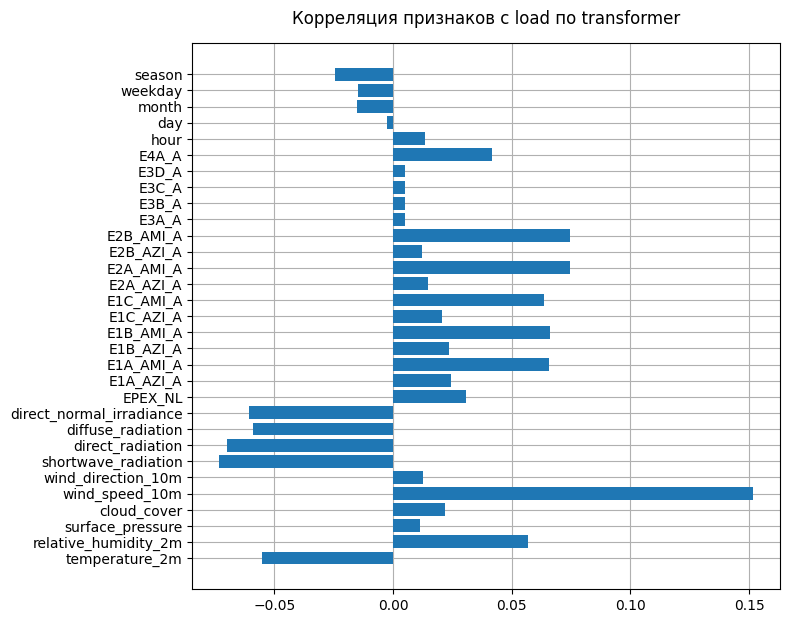

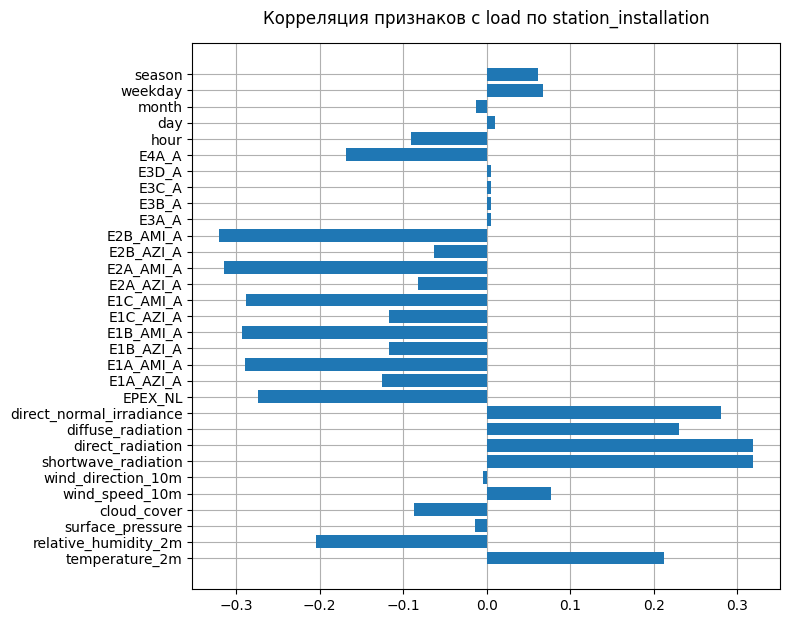

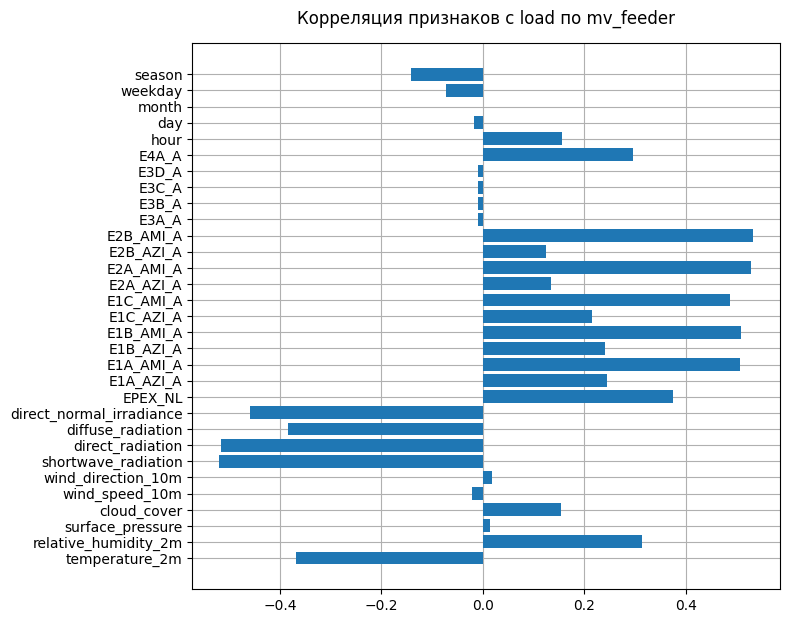

In [28]:
numeric_cols = df.select_dtypes(include='number').columns.tolist()

for group in df['group'].unique():
    subset = df[df['group'] == group][numeric_cols]
    corr = subset.corr()['load'].drop('load')

    plt.figure(figsize=(8, 6))
    plt.barh(y=corr.index, width=corr.values, zorder=3)
    plt.grid(zorder=0)
    plt.tight_layout()
    plt.title(f'Корреляция признаков с load по {group}', y=1.02)
    plt.show()

<Axes: title={'center': 'Корреляция по mv_feeder'}>

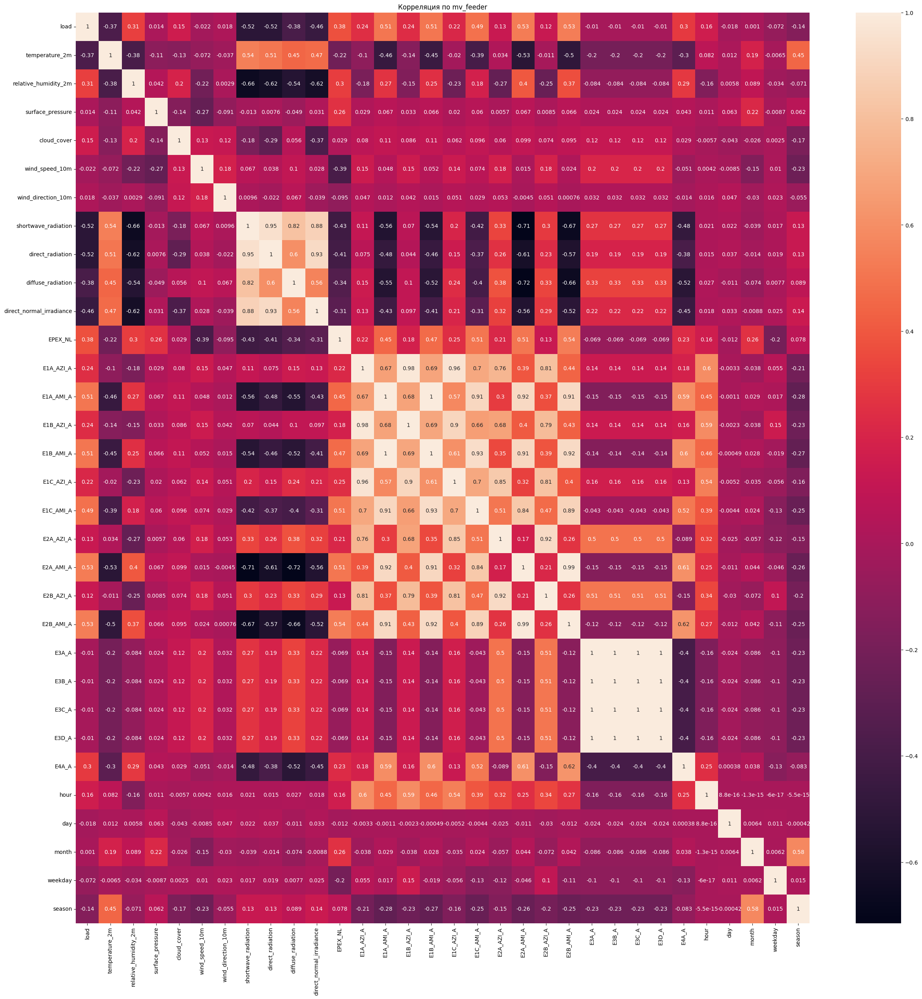

In [29]:
corr = df[df.group == 'mv_feeder'][numeric_cols].corr()
plt.figure(figsize=(30, 30))
plt.title("Корреляция по mv_feeder")
sns.heatmap(corr, annot=True)

<Axes: title={'center': 'Корреляция по transformer'}>

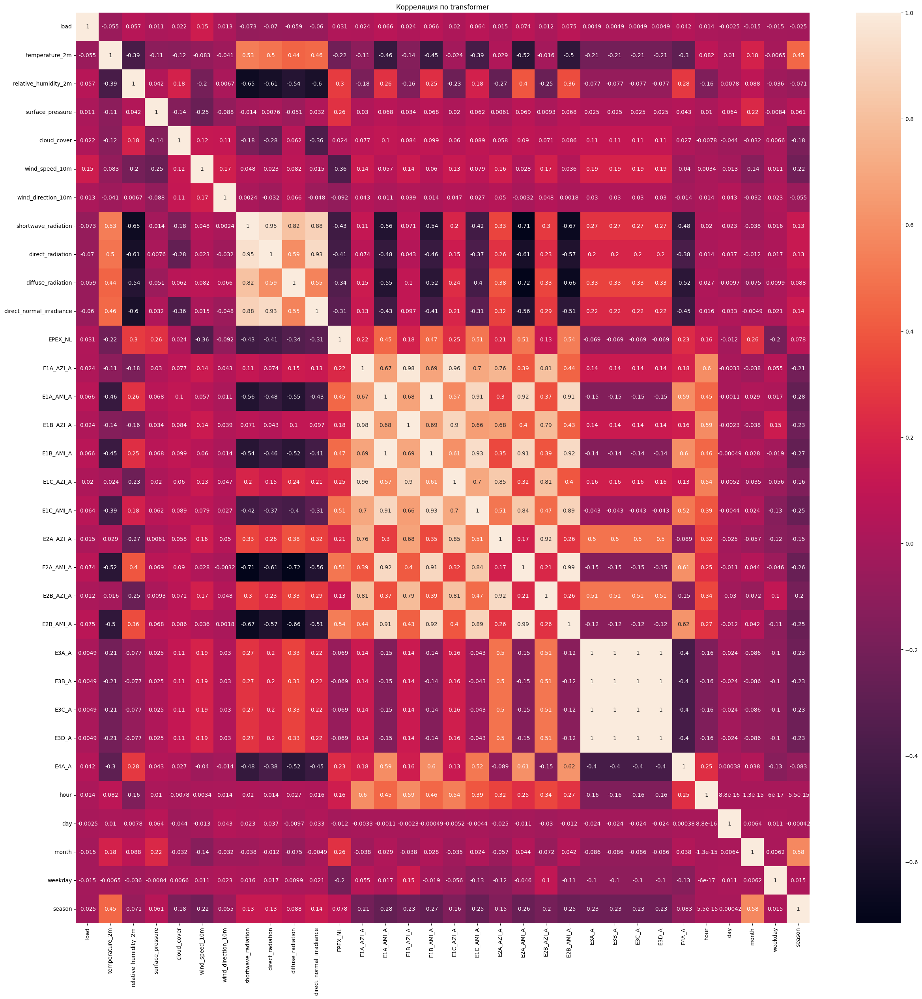

In [30]:
corr = df[df.group == 'transformer'][numeric_cols].corr()
plt.figure(figsize=(30, 30))
plt.title("Корреляция по transformer")
sns.heatmap(corr, annot=True)

<Axes: title={'center': 'Корреляция по station_installation'}>

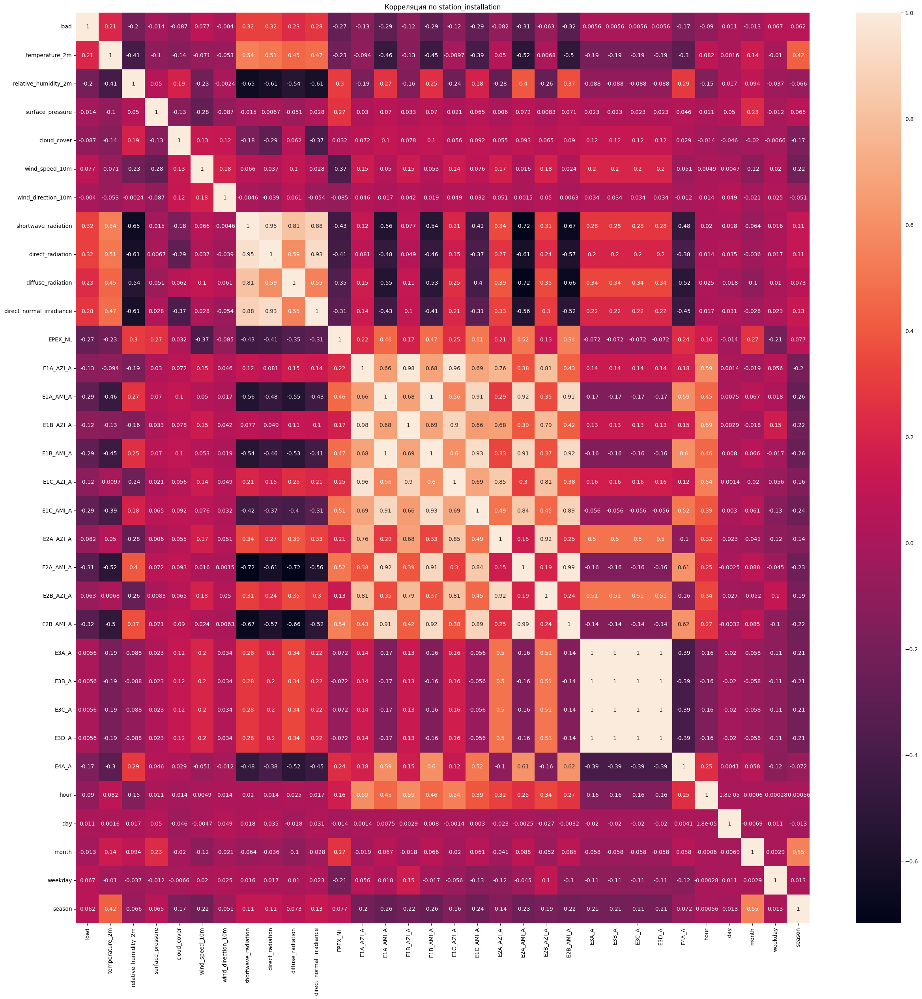

In [31]:
corr = df[df.group == 'station_installation'][numeric_cols].corr()
plt.figure(figsize=(30, 30))
plt.title("Корреляция по station_installation")
sns.heatmap(corr, annot=True)

# Baseline

In [32]:
import lightgbm as lgb
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler, LabelEncoder

In [33]:
train_end = '2024-10-31 23:45:00+00:00'
train_df = df[df['timestamp'] <= train_end].copy()
test_df = df[df['timestamp'] > train_end].copy()

print(f"Train: {train_df['timestamp'].min()} - {train_df['timestamp'].max()}")
print(f"Test:  {test_df['timestamp'].min()} - {test_df['timestamp'].max()}")
print(f"Train size: {len(train_df)}, Test size: {len(test_df)}")

Train: 2024-01-01 00:00:00+00:00 - 2024-10-31 23:45:00+00:00
Test:  2024-11-01 00:00:00+00:00 - 2024-12-31 23:45:00+00:00
Train size: 1301123, Test size: 263520


In [34]:
feature_cols = [
    col for col in df.columns
    if col not in ['timestamp', 'load', 'station']
]

X_train = train_df[feature_cols].copy()
y_train = train_df['load'].copy()

X_test = test_df[feature_cols].copy()
y_test = test_df['load'].copy()

In [35]:
df.columns

Index(['timestamp', 'load', 'station', 'group', 'temperature_2m',
       'relative_humidity_2m', 'surface_pressure', 'cloud_cover',
       'wind_speed_10m', 'wind_direction_10m', 'shortwave_radiation',
       'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance',
       'EPEX_NL', 'E1A_AZI_A', 'E1A_AMI_A', 'E1B_AZI_A', 'E1B_AMI_A',
       'E1C_AZI_A', 'E1C_AMI_A', 'E2A_AZI_A', 'E2A_AMI_A', 'E2B_AZI_A',
       'E2B_AMI_A', 'E3A_A', 'E3B_A', 'E3C_A', 'E3D_A', 'E4A_A', 'hour', 'day',
       'month', 'weekday', 'is_weekend', 'season', 'is_holiday',
       'day_category'],
      dtype='object')

In [36]:
from sklearn.preprocessing import OrdinalEncoder

categorical_features = ['group', 'day_category']

X_train_encoded = X_train.copy()
X_test_encoded = X_test.copy()

encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)

X_train_encoded[categorical_features] = encoder.fit_transform(X_train[categorical_features])
X_test_encoded[categorical_features] = encoder.transform(X_test[categorical_features])

In [37]:
categorical_features.extend(['season', 'weekday'])

In [38]:
params = {
    'objective': 'regression',
    'metric': 'rmse',
    'boosting_type': 'gbdt',
    'num_leaves': 64,
    'random_state': 42,
}

train_data = lgb.Dataset(X_train_encoded, y_train, categorical_feature=categorical_features)
test_data = lgb.Dataset(X_test_encoded, y_test, categorical_feature=categorical_features, reference=train_data)

model = lgb.train(
    params,
    train_data,
    valid_sets=[test_data],
    num_boost_round=500,
    callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=True)]
)

y_pred = model.predict(X_test_encoded, num_iteration=model.best_iteration)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.575725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6689
[LightGBM] [Info] Number of data points in the train set: 1301123, number of used features: 35
[LightGBM] [Info] Start training from score -2015513.912813
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[18]	valid_0's rmse: 1.40188e+07


In [39]:
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)

print(f"LightGBM RMSE: {rmse:,.2f}")
print(f"LightGBM MAE:  {mae:,.2f}")

LightGBM RMSE: 14,018,838.40
LightGBM MAE:  8,969,548.80


# Работа с аномалиями
Улучшений не дала, что логично, поскольку на графиках из EDA видно, что среди данных мало выбросов и данные реальные

In [40]:
# profile_cols = [
#     'E1A_AZI_A', 'E1A_AMI_A', 'E1B_AZI_A', 'E1B_AMI_A', 'E1C_AZI_A',
#     'E1C_AMI_A', 'E2A_AZI_A', 'E2A_AMI_A', 'E2B_AZI_A', 'E2B_AMI_A',
#     'E3A_A', 'E3B_A', 'E3C_A', 'E3D_A', 'E4A_A'
# ]

# features_to_check = [
#     'load', 'temperature_2m', 'EPEX_NL', 'relative_humidity_2m', 'surface_pressure',
#     'cloud_cover', 'wind_speed_10m', 'wind_direction_10m', 'shortwave_radiation',
#     'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance'
# ] + profile_cols

# window_size = 96

# df = df.sort_values(['station', 'timestamp']).copy()

# for feature in features_to_check:
#     print(f"Обработка фичи: {feature}")

#     df[f'{feature}_q1'] = df.groupby('station')[feature].transform(
#         lambda x: x.shift(1).rolling(window=window_size, min_periods=1).quantile(0.25)
#     )
#     df[f'{feature}_q3'] = df.groupby('station')[feature].transform(
#         lambda x: x.shift(1).rolling(window=window_size, min_periods=1).quantile(0.75)
#     )
#     df[f'{feature}_iqr'] = df[f'{feature}_q3'] - df[f'{feature}_q1']

#     lower_bound = df[f'{feature}_q1'] - 1.5 * df[f'{feature}_iqr']
#     upper_bound = df[f'{feature}_q3'] + 1.5 * df[f'{feature}_iqr']

#     df[f'is_anomaly_{feature}'] = (
#         (df[feature] < lower_bound) | (df[feature] > upper_bound)
#     ).astype(int)

#     df.drop(columns=[f'{feature}_q1', f'{feature}_q3', f'{feature}_iqr'], inplace=True)

# Доп генерация фичей

In [41]:
df = df.sort_values(['station', 'timestamp']).copy()

df['hour_sin'] = np.sin(2 * np.pi * df['hour'] / 24)
df['hour_cos'] = np.cos(2 * np.pi * df['hour'] / 24)

df['weekday_sin'] = np.sin(2 * np.pi * df['weekday'] / 7)
df['weekday_cos'] = np.cos(2 * np.pi * df['weekday'] / 7)

df['month_sin'] = np.sin(2 * np.pi * (df['month'] - 1) / 12)
df['month_cos'] = np.cos(2 * np.pi * (df['month'] - 1) / 12)

df['is_business_hours'] = ((df['weekday'] < 5) & (df['hour'].between(8, 18))).astype('int8')
df['is_night'] = df['hour'].between(0, 5).astype('int8')
df['is_evening_peak'] = df['hour'].between(17, 21).astype('int8')

grouped_station = df.groupby('station', group_keys=False)

for lag in [1, 4, 96]:
    df[f'load_lag_{lag}'] = grouped_station['load'].shift(lag)

df['EPEX_NL_diff_1h'] = grouped_station['EPEX_NL'].diff(4)

profile_cols = [
    'E1A_AZI_A', 'E1A_AMI_A', 'E1B_AZI_A', 'E1B_AMI_A', 'E1C_AZI_A',
    'E1C_AMI_A', 'E2A_AZI_A', 'E2A_AMI_A', 'E2B_AZI_A', 'E2B_AMI_A',
    'E3A_A', 'E3B_A', 'E3C_A', 'E3D_A', 'E4A_A'
]

Сгенерены циклические признаки, помогающие модели уловить сезонность, признаки, показывающие период, лаговые признаки, скользящие средние нагрузки, наличие отопительного сезона, разница цен, скользящее среднее их же, аггрегированные признаки потребления

# Та же самая модель, но обученная на датасете со сгенерированными фичами

In [42]:
train_end = '2024-10-31 23:45:00+00:00'
train_df = df[df['timestamp'] <= train_end].copy()
test_df = df[df['timestamp'] > train_end].copy()

print(f"Train: {train_df['timestamp'].min()} - {train_df['timestamp'].max()}")
print(f"Test:  {test_df['timestamp'].min()} - {test_df['timestamp'].max()}")
print(f"Train size: {len(train_df)}, Test size: {len(test_df)}")

Train: 2024-01-01 00:00:00+00:00 - 2024-10-31 23:45:00+00:00
Test:  2024-11-01 00:00:00+00:00 - 2024-12-31 23:45:00+00:00
Train size: 1301123, Test size: 263520


In [43]:
feature_cols = [
    col for col in df.columns
    if col not in ['timestamp', 'load', 'station']
]

X_train = train_df[feature_cols].copy()
y_train = train_df['load'].copy()

X_test = test_df[feature_cols].copy()
y_test = test_df['load'].copy()

In [44]:
categorical_features = ['group', 'day_category']

X_train_encoded = X_train.copy()
X_test_encoded = X_test.copy()

encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)

X_train_encoded[categorical_features] = encoder.fit_transform(X_train[categorical_features])
X_test_encoded[categorical_features] = encoder.transform(X_test[categorical_features])

In [45]:
categorical_features.extend(['season', 'weekday'])

In [46]:
params = {
    'objective': 'regression',
    'metric': 'rmse',
    'boosting_type': 'gbdt',
    'num_leaves': 64,
    'random_state': 42,
}

train_data = lgb.Dataset(X_train_encoded, y_train, categorical_feature=categorical_features)
test_data = lgb.Dataset(X_test_encoded, y_test, categorical_feature=categorical_features, reference=train_data)

model = lgb.train(
    params,
    train_data,
    valid_sets=[test_data],
    num_boost_round=500,
    callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=True)]
)

y_pred = model.predict(X_test_encoded, num_iteration=model.best_iteration)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.396012 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7787
[LightGBM] [Info] Number of data points in the train set: 1301123, number of used features: 48
[LightGBM] [Info] Start training from score -2015513.912813
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[298]	valid_0's rmse: 1.29489e+06


In [47]:
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)

print(f"LightGBM RMSE с новыми фичами: {rmse:,.2f}")
print(f"LightGBM MAE с новыми фичами:  {mae:,.2f}")

LightGBM RMSE с новыми фичами: 1,294,885.72
LightGBM MAE с новыми фичами:  543,739.11


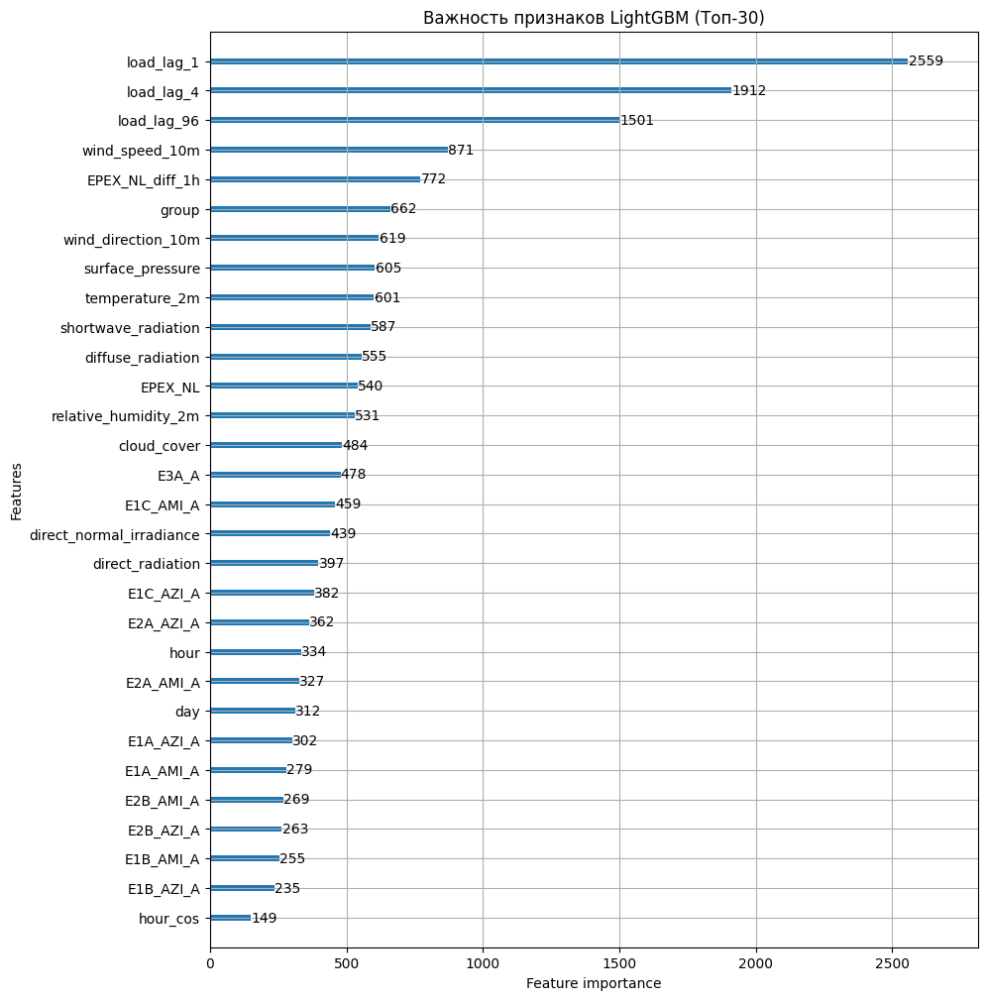

In [48]:
lgb.plot_importance(model, max_num_features=30, figsize=(10, 12))
plt.title('Важность признаков LightGBM (Топ-30)')
plt.show()

**Вывод**

Самую большую важность имеют лаговые фичи, но так же сильную значимость показали радиационные признаки, скользящие средние и признак группа. Хотя группа и не является самой важной, стоит учесть сильные различные различия и попробовать натренировать 3 отдельные модели для каждого типа загрузки

# Доп генерация фичей 2


In [49]:
df = df.sort_values(['station', 'timestamp']).copy()

df['dayofyear'] = df['timestamp'].dt.dayofyear
df['weekday_hour'] = df['weekday'] * 24 + df['hour']


group_wh = df.groupby(['station', 'weekday_hour'])

daily = df.groupby(['station'])['load'].agg(
    daily_load_mean='mean',
    daily_load_max='max',
    daily_load_min='min',
    daily_load_std='std',
).sort_values(['station'])

df['load_lag_672'] = df.groupby('station')['load'].shift(96 * 7)

# Та же модель на доп фичах 2: (уже нет, поставил 1000 деревьев)

In [50]:
train_end = '2024-10-31 23:45:00+00:00'
train_df = df[df['timestamp'] <= train_end].copy()
test_df = df[df['timestamp'] > train_end].copy()

print(f"Train: {train_df['timestamp'].min()} - {train_df['timestamp'].max()}")
print(f"Test:  {test_df['timestamp'].min()} - {test_df['timestamp'].max()}")
print(f"Train size: {len(train_df)}, Test size: {len(test_df)}")

Train: 2024-01-01 00:00:00+00:00 - 2024-10-31 23:45:00+00:00
Test:  2024-11-01 00:00:00+00:00 - 2024-12-31 23:45:00+00:00
Train size: 1301123, Test size: 263520


In [51]:
feature_cols = [
    col for col in df.columns
    if col not in ['timestamp', 'load', 'station']
]

X_train = train_df[feature_cols].copy()
y_train = train_df['load'].copy()

X_test = test_df[feature_cols].copy()
y_test = test_df['load'].copy()

In [52]:
categorical_features = ['group', 'day_category']

X_train_encoded = X_train.copy()
X_test_encoded = X_test.copy()

encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)

X_train_encoded[categorical_features] = encoder.fit_transform(X_train[categorical_features])
X_test_encoded[categorical_features] = encoder.transform(X_test[categorical_features])

categorical_features.extend(['season', 'weekday'])

In [53]:
params = {
    'objective': 'regression',
    'metric': 'rmse',
    'boosting_type': 'gbdt',
    'num_leaves': 64,
    'random_state': 42,
}

train_data = lgb.Dataset(X_train_encoded, y_train, categorical_feature=categorical_features)
test_data = lgb.Dataset(X_test_encoded, y_test, categorical_feature=categorical_features, reference=train_data)

model = lgb.train(
    params,
    train_data,
    valid_sets=[test_data],
    num_boost_round=1000,
    callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=True)]
)

y_pred = model.predict(X_test_encoded, num_iteration=model.best_iteration)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.526433 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8454
[LightGBM] [Info] Number of data points in the train set: 1301123, number of used features: 51
[LightGBM] [Info] Start training from score -2015513.912813
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[274]	valid_0's rmse: 1.27733e+06


In [54]:
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)

print(f"LightGBM RMSE с новыми фичами: {rmse:,.2f}")
print(f"LightGBM MAE с новыми фичами:  {mae:,.2f}")

LightGBM RMSE с новыми фичами: 1,277,332.47
LightGBM MAE с новыми фичами:  543,502.93


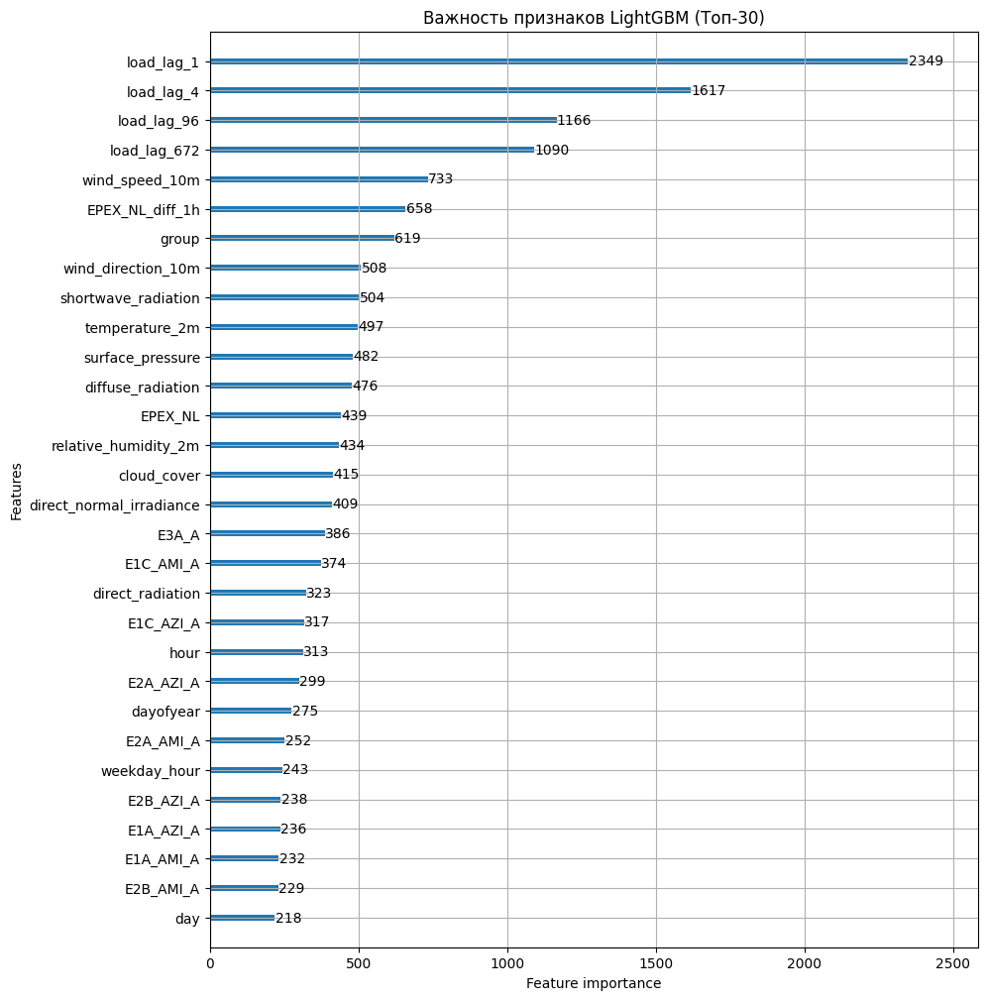

In [55]:
lgb.plot_importance(model, max_num_features=30, figsize=(10, 12))
plt.title('Важность признаков LightGBM (Топ-30)')
plt.show()

In [56]:
groups_to_evaluate = ['transformer', 'station_installation', 'mv_feeder']

results = {}

for group_name in groups_to_evaluate:
    group_indices = test_df[test_df['group'] == group_name].index

    y_test_group = y_test.loc[group_indices]
    y_pred_group = pd.Series(y_pred, index=X_test_encoded.index).loc[group_indices]

    rmse_group = np.sqrt(mean_squared_error(y_test_group, y_pred_group))
    mae_group = mean_absolute_error(y_test_group, y_pred_group)

    results[group_name] = {'RMSE': rmse_group, 'MAE': mae_group}

print("\nМетрики по группам:")
for group, metrics in results.items():
    print(f"Группа: {group}")
    print(f"  RMSE: {metrics['RMSE']:,.2f}")
    print(f"  MAE:  {metrics['MAE']:,.2f}")



Метрики по группам:
Группа: transformer
  RMSE: 1,658,144.96
  MAE:  847,441.09
Группа: station_installation
  RMSE: 1,448,711.59
  MAE:  686,750.53
Группа: mv_feeder
  RMSE: 215,696.02
  MAE:  96,317.16


Как видно на диаграмме важностей фичей, лаговая переменная за одну неделю оказалась тоже важной, пользу принес день в году по счету

# Тренировка отдельных моделей для каждого типа load

In [58]:
unique_groups = df['group'].unique()
group_predictions = {}
group_data = {}
group_models = {}

for group_name in unique_groups:
    print(f"Тренировка модели для группы: {group_name}")

    X_train_group = X_train_encoded[train_df['group'] == group_name]
    y_train_group = y_train[train_df['group'] == group_name]
    X_test_group = X_test_encoded[test_df['group'] == group_name]
    y_test_group = y_test[test_df['group'] == group_name]

    train_data_group = lgb.Dataset(X_train_group, label=y_train_group, categorical_feature=categorical_features)
    test_data_group = lgb.Dataset(X_test_group, label=y_test_group, reference=train_data_group, categorical_feature=categorical_features)

    group_data[group_name] = (X_train_group, y_train_group, X_test_group, y_test_group)

    model_group = lgb.train(
        params,
        train_data_group,
        valid_sets=[test_data_group],
        num_boost_round=1000,
        callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=True)]
    )

    group_models[group_name] = model_group

    y_pred_group = model_group.predict(X_test_group, num_iteration=model_group.best_iteration)

    group_predictions[group_name] = {
        'y_test': y_test_group,
        'y_pred': y_pred_group
    }

Тренировка модели для группы: station_installation
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.260699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8454
[LightGBM] [Info] Number of data points in the train set: 422723, number of used features: 50
[LightGBM] [Info] Start training from score -7051045.030464
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[434]	valid_0's rmse: 1.40363e+06
Тренировка модели для группы: transformer
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.267348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8451
[LightGBM] [Info] Number of data points in the train set: 439200, number of used features: 50
[LightGBM] [Info] Start training from score 100407.990955
Training until validation scores don't improve for 50 rounds
Early stopping, be

In [59]:
group_metrics = {}
all_y_test = []
all_y_pred = []

print("Метрики по группам:")
for group_name, data in group_predictions.items():
    y_test_group = data['y_test']
    y_pred_group = data['y_pred']

    rmse_group = np.sqrt(mean_squared_error(y_test_group, y_pred_group))
    mae_group = mean_absolute_error(y_test_group, y_pred_group)

    group_metrics[group_name] = {'RMSE': rmse_group, 'MAE': mae_group}

    print(f"Группа: {group_name}")
    print(f"  RMSE: {rmse_group:,.2f}")
    print(f"  MAE:  {mae_group:,.2f}")

    all_y_test.extend(y_test_group.tolist())
    all_y_pred.extend(y_pred_group.tolist())

overall_rmse = np.sqrt(mean_squared_error(all_y_test, all_y_pred))
overall_mae = mean_absolute_error(all_y_test, all_y_pred)

print(f"\nОбщее RMSE: {overall_rmse:,.2f}")
print(f"Общее MAE:  {overall_mae:,.2f}")

Метрики по группам:
Группа: station_installation
  RMSE: 1,403,633.82
  MAE:  676,430.07
Группа: transformer
  RMSE: 1,565,949.08
  MAE:  793,433.56
Группа: mv_feeder
  RMSE: 113,536.12
  MAE:  55,999.32

Общее RMSE: 1,215,904.99
Общее MAE:  508,620.98


**Вывод**
- незначительно уменьшился общий MAE
- снизились MAE для station_installation и mv_feeder
- увеличился MAE для transformer

# Feature selection для слабокоррелирующих фичей

In [ ]:
"""excluded_cols = ['timestamp', 'load', 'station']
categorical_features_fixed = [
    'group', 'day_category', 'weekday_hour', 'is_holiday', 'is_weekend',
    'is_business_hours', 'is_night', 'is_evening_peak', 'season', 'weekday'
]

numerical_feature_candidates = df.select_dtypes(include=np.number).columns.tolist()
numerical_feature_candidates = [
    col for col in numerical_feature_candidates
    if col not in excluded_cols and col not in categorical_features_fixed
]

print(f"Excluded columns: {excluded_cols}")
print(f"Fixed categorical features: {categorical_features_fixed}")
print(f"Numerical feature candidates ({len(numerical_feature_candidates)}): {numerical_feature_candidates}")"""

In [ ]:
"""correlation_threshold = 0.1
selected_numerical_features_by_group = {}

for group_name in df['group'].unique():
    group_df = df[df['group'] == group_name].copy()

    current_numerical_features = [col for col in numerical_feature_candidates if col in group_df.columns]

    if 'load' in group_df.columns and current_numerical_features:
        correlations = group_df[current_numerical_features + ['load']].corr()['load'].abs()

        selected_features = correlations[correlations > correlation_threshold].index.tolist()
        if 'load' in selected_features:
            selected_features.remove('load')

        selected_numerical_features_by_group[group_name] = selected_features
    else:
        selected_numerical_features_by_group[group_name] = []

for group, features in selected_numerical_features_by_group.items():
    print(f"  {group}: {len(features)} features - {features}")"""

# Результаты обучения отдельных моделей + Feature selection

In [ ]:
"""categorical_features_fixed = [
    'day_category', 'weekday_hour', 'is_holiday', 'is_weekend',
    'is_business_hours', 'is_night', 'is_evening_peak', 'season', 'weekday'
]"""

In [ ]:
"""train_end = '2024-10-31 23:45:00+00:00'
train_df_all = df[df['timestamp'] <= train_end].copy()
test_df_all = df[df['timestamp'] > train_end].copy()

unique_groups = df['group'].unique()
models = {}
group_predictions = {}
group_metrics = {}
X_train_encoded_by_group = {}
X_test_encoded_by_group = {}

overall_y_test = []
overall_y_pred = []

for group_name in unique_groups:
    print(f"Тренировка lgbm для группы: {group_name}")

    group_feature_cols = selected_numerical_features_by_group.get(group_name, []) + \
                         [col for col in categorical_features_fixed if col != 'group']

    train_df_group = train_df_all[train_df_all['group'] == group_name]
    test_df_group = test_df_all[test_df_all['group'] == group_name]

    X_train_group = train_df_group[group_feature_cols].copy()
    y_train_group = train_df_group['load'].copy()

    X_test_group = test_df_group[group_feature_cols].copy()
    y_test_group = test_df_group['load'].copy()

    categorical_for_encoding = [col for col in categorical_features_fixed if col != 'group' and col in X_train_group.columns]

    if not X_train_group.empty and not X_test_group.empty:
        group_encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
        for col in categorical_for_encoding:
            X_train_group[col] = group_encoder.fit_transform(X_train_group[[col]], y_train_group)
            X_test_group[col] = group_encoder.transform(X_test_group[[col]])

        params = {
            'objective': 'regression',
            'metric': 'rmse',
            'boosting_type': 'gbdt',
            'num_leaves': 64,
            'learning_rate': 0.05,
            'feature_fraction': 0.9,
            'bagging_fraction': 0.8,
            'bagging_freq': 5,
            'verbose': -1,
            'n_jobs': -1,
            'seed': 42,
            'boosting_seed': 42,
            'data_random_seed': 42,
        }

        train_data = lgb.Dataset(X_train_group, label=y_train_group, categorical_feature=categorical_features_fixed)
        test_data = lgb.Dataset(X_test_group, label=y_test_group, reference=train_data, categorical_feature=categorical_features_fixed)

        model = lgb.train(
            params,
            train_data,
            valid_sets=[test_data],
            num_boost_round=1000,
            callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=False)]
        )

        y_pred_group = model.predict(X_test_group, num_iteration=model.best_iteration)

        rmse_group = np.sqrt(mean_squared_error(y_test_group, y_pred_group))
        mae_group = mean_absolute_error(y_test_group, y_pred_group)

        models[group_name] = model
        group_metrics[group_name] = {'RMSE': rmse_group, 'MAE': mae_group}
        group_predictions[group_name] = {'y_test': y_test_group, 'y_pred': y_pred_group}
        X_train_encoded_by_group[group_name] = X_train_group
        X_test_encoded_by_group[group_name] = X_test_group

        overall_y_test.extend(y_test_group.tolist())
        overall_y_pred.extend(y_pred_group.tolist())

        print(f"  RMSE: {rmse_group:,.2f}")
        print(f"  MAE:  {mae_group:,.2f}")

print("\n--- Summary ---")
print("Метрики по группам:")
for group_name, metrics in group_metrics.items():
    print(f"  {group_name}: RMSE = {metrics['RMSE']:,.2f}, MAE = {metrics['MAE']:,.2f}")


overall_rmse = np.sqrt(mean_squared_error(overall_y_test, overall_y_pred))
overall_mae = mean_absolute_error(overall_y_test, overall_y_pred)
print(f"Общий RMSE: {overall_rmse:,.2f}")
print(f"Общий MAE:  {overall_mae:,.2f}")
"""

**Вывод**
Feature selection ухудшил качество для всех метрик

Было: \
Метрики по группам: \
Группа: station_installation \
  RMSE: 1,403,633.82 \
  MAE:  676,430.07 \
Группа: transformer \
  RMSE: 1,565,949.08 \
  MAE:  793,433.56 \
Группа: mv_feeder \
  RMSE: 113,536.12 \
  MAE:  55,999.32 \

Общее RMSE: 1,215,904.99 \
Общее MAE:  508,620.98

Стало: \
Тренировка lgbm для группы: station_installation \
  RMSE: 1,428,120.98\
  MAE:  683,398.46\
Тренировка lgbm для группы: transformer \
  RMSE: 1,632,957.07\
  MAE:  847,347.54\
Тренировка lgbm для группы: mv_feeder\
  RMSE: 114,922.70\
  MAE:  56,554.54

Общий RMSE: 1,254,230.91 \
Общий MAE:  529,100.18

# SHAP + LIME

In [60]:
!pip install shap lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=1a21b57db7298c4d6d8b311db26fa79de653f6cb2fc022f189fb56a7170f0655
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [61]:
import shap
from lime.lime_tabular import LimeTabularExplainer
from sklearn.linear_model import LinearRegression

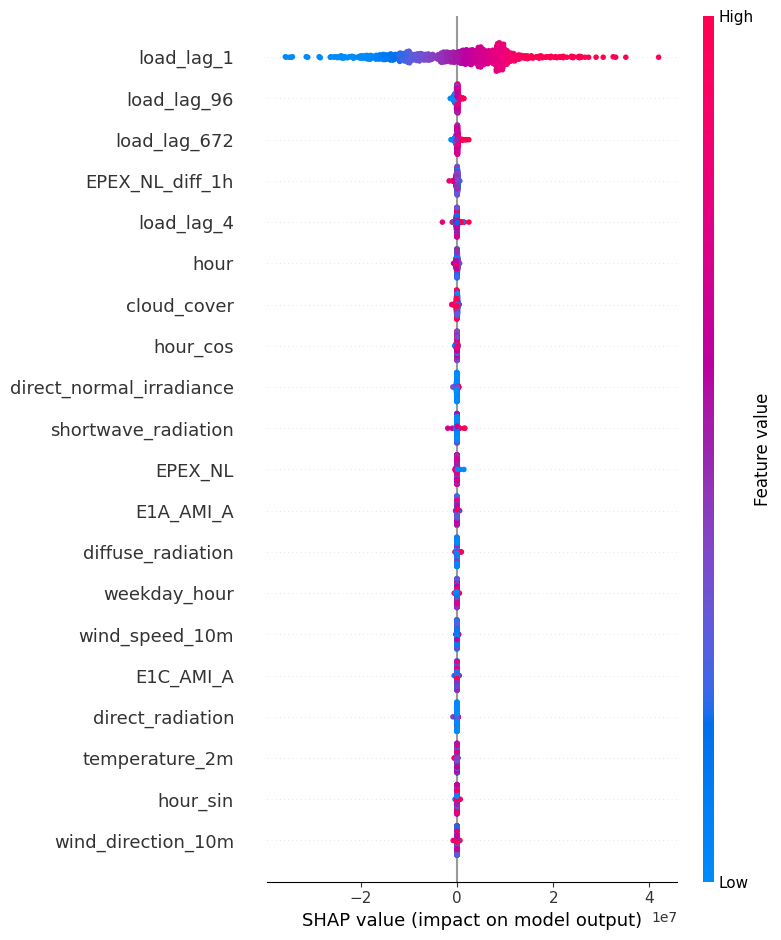

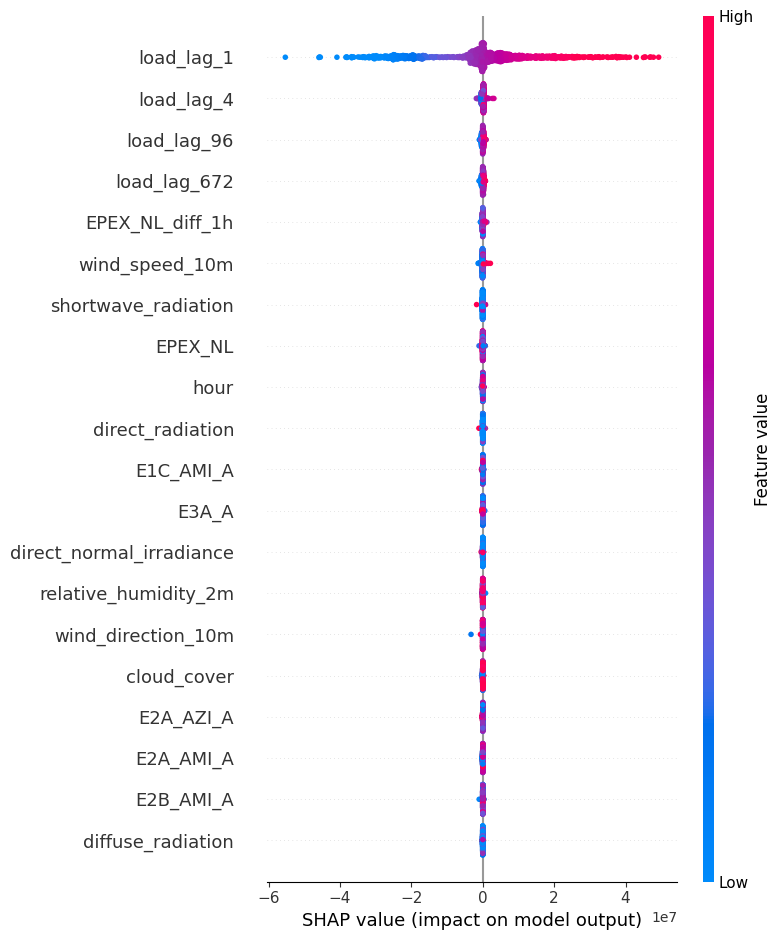

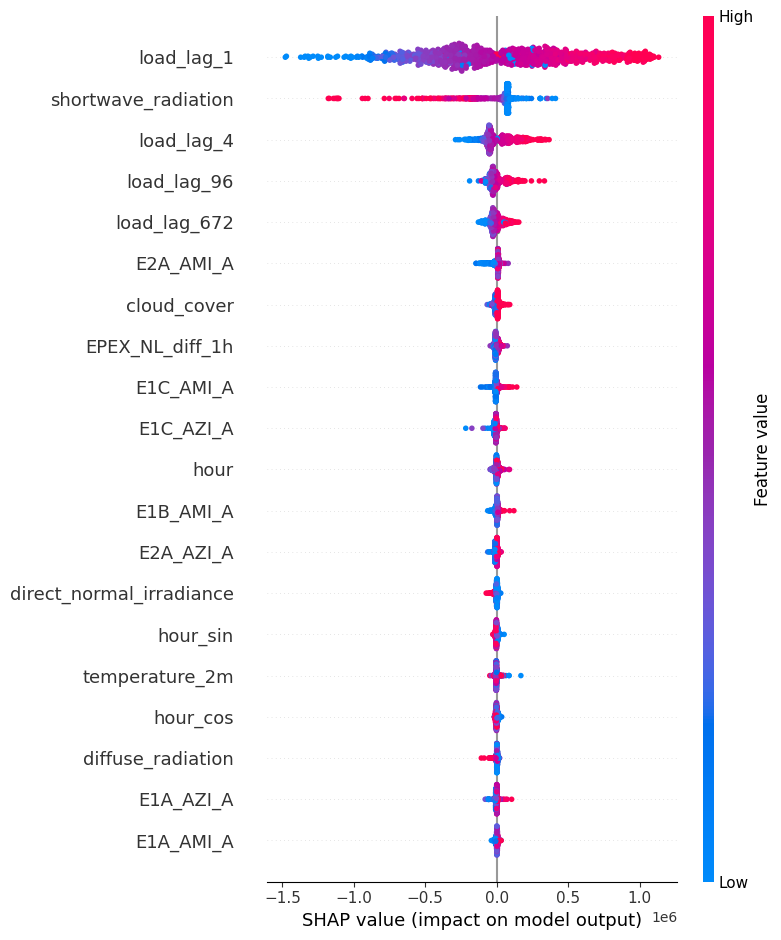

In [62]:
for group_name, model in group_models.items():
    data = group_data[group_name]
    model_features = data[0].columns.tolist()

    X_train_group = data[0].copy()
    X_test_group  = data[2].copy()

    n_sample = min(1000, len(X_train_group))
    X_train_shap_sample = X_train_group.sample(n_sample, random_state=42)

    tree_explainer = shap.TreeExplainer(model)

    shap_values_train = tree_explainer.shap_values(
        X_train_shap_sample,
        check_additivity=False
    )

    shap.summary_plot(
        shap_values_train,
        X_train_shap_sample,
        feature_names=model_features
    )

In [65]:
lin_models = {}
group_lin_predictions = {}
group_lin_metrics = {}

overall_y_test_lin = []
overall_y_pred_lin = []

for group_name in unique_groups:
    print(f"Тренировка линейной регрессии для группы: {group_name}")

    data = group_data[group_name]
    X_train_group = data[0].copy()
    y_train_group = data[1].copy()

    mask = X_train_group.notna().all(axis=1)
    X_train_group = X_train_group[mask]
    y_train_group = y_train_group[mask]

    X_test_group = data[2].copy()
    y_test_group = data[3].copy()

    model = LinearRegression()
    model.fit(X_train_group, y_train_group)

    y_pred_group = model.predict(X_test_group)

    rmse_group = np.sqrt(mean_squared_error(y_test_group, y_pred_group))
    mae_group = mean_absolute_error(y_test_group, y_pred_group)

    lin_models[group_name] = model
    group_lin_metrics[group_name] = {'RMSE': rmse_group, 'MAE': mae_group}
    group_lin_predictions[group_name] = {'y_test': y_test_group, 'y_pred': y_pred_group}

    overall_y_test_lin.extend(y_test_group.tolist())
    overall_y_pred_lin.extend(y_pred_group.tolist())

    print(f"  RMSE: {rmse_group:,.2f}")
    print(f"  MAE:  {mae_group:,.2f}")

print("\n--- Summary (Linear Regression) ---")
print("Метрики по группам:")
for group_name, metrics in group_lin_metrics.items():
    print(f"  {group_name}: RMSE = {metrics['RMSE']:,.2f}, MAE = {metrics['MAE']:,.2f}")

overall_rmse_lin = np.sqrt(mean_squared_error(overall_y_test_lin, overall_y_pred_lin))
overall_mae_lin = mean_absolute_error(overall_y_test_lin, overall_y_pred_lin)
print(f"Общий RMSE: {overall_rmse_lin:,.2f}")
print(f"Общий MAE:  {overall_mae_lin:,.2f}")

Тренировка линейной регрессии для группы: station_installation
  RMSE: 1,180,071.61
  MAE:  652,703.59
Тренировка линейной регрессии для группы: transformer
  RMSE: 1,883,824.07
  MAE:  973,973.39
Тренировка линейной регрессии для группы: mv_feeder
  RMSE: 589,186.91
  MAE:  397,949.11

--- Summary (Linear Regression) ---
Метрики по группам:
  station_installation: RMSE = 1,180,071.61, MAE = 652,703.59
  transformer: RMSE = 1,883,824.07, MAE = 973,973.39
  mv_feeder: RMSE = 589,186.91, MAE = 397,949.11
Общий RMSE: 1,327,717.76
Общий MAE:  674,875.36


In [75]:
masks = []

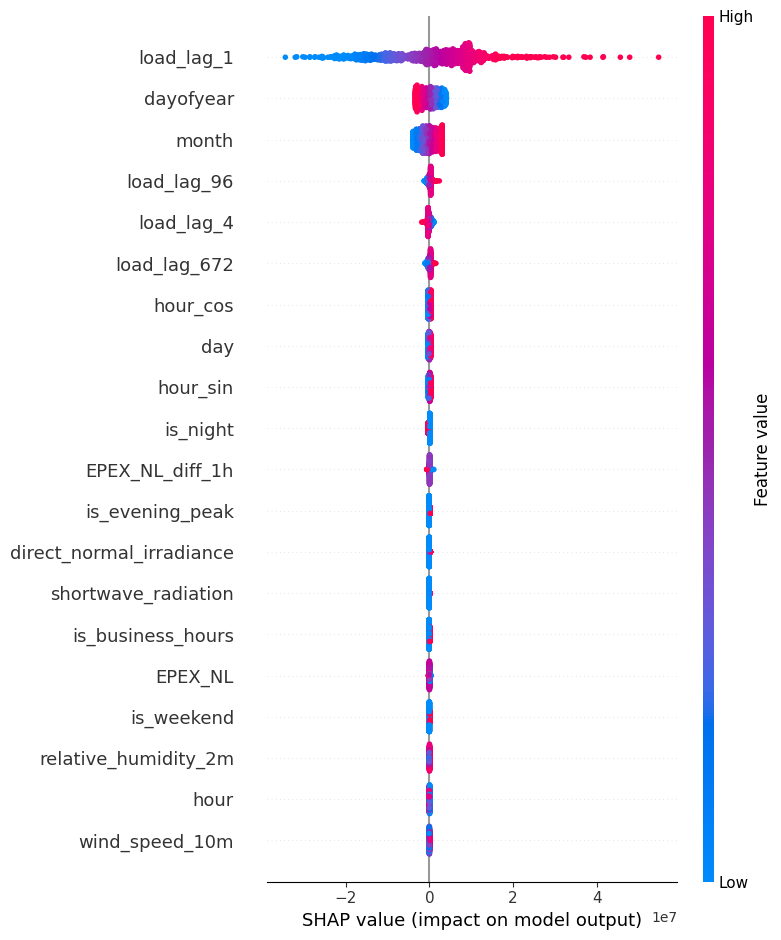

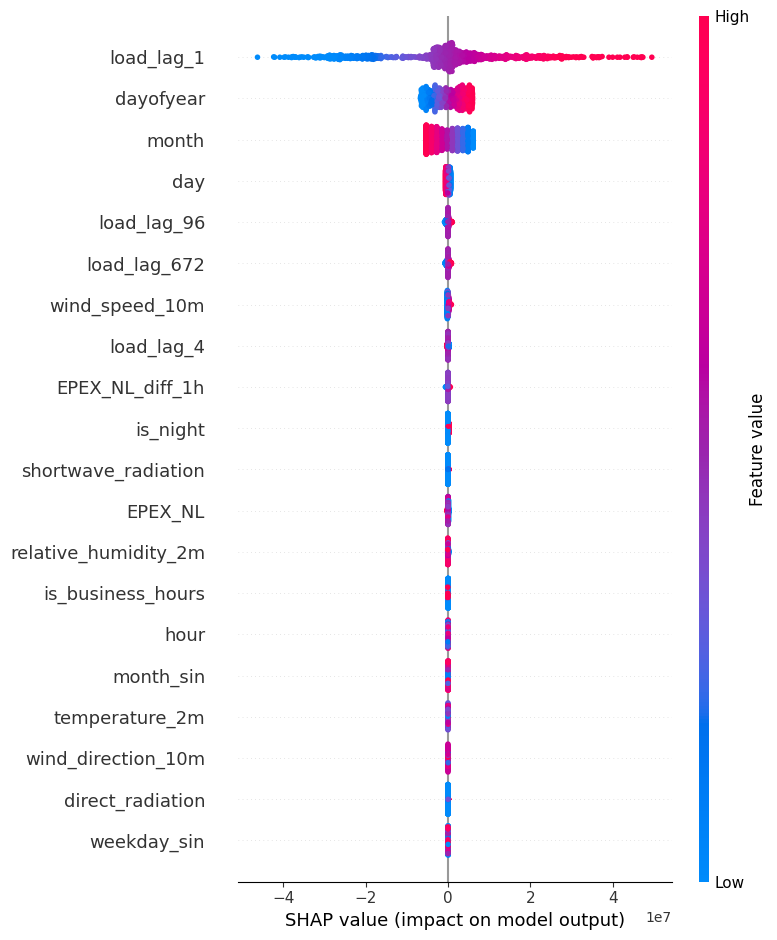

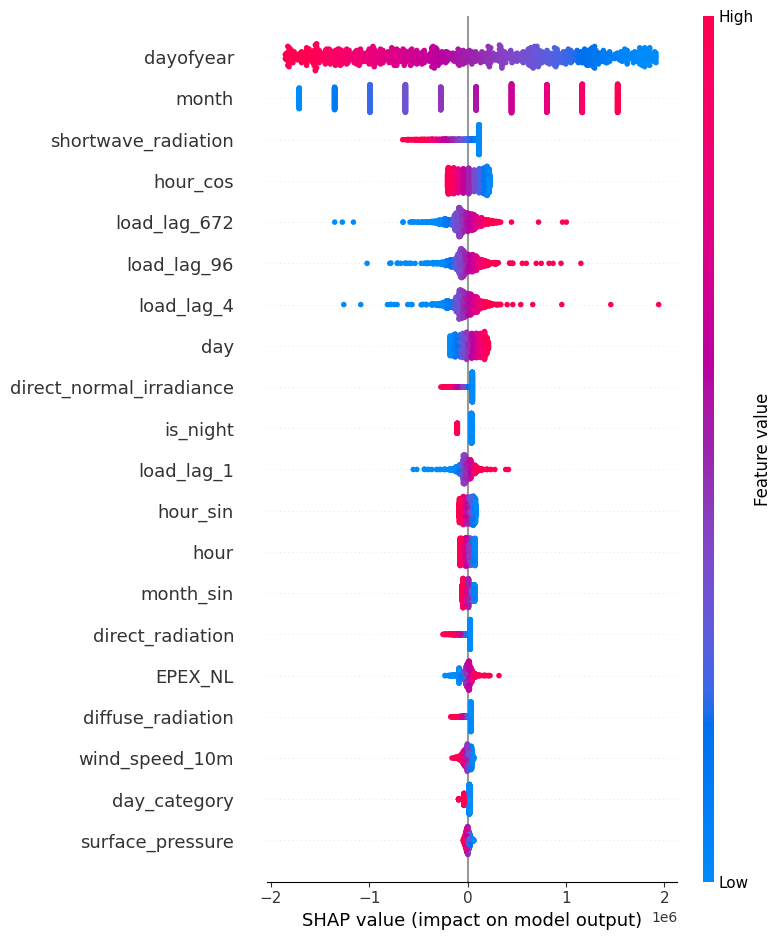

In [82]:
for group_name, model in lin_models.items():
    data = group_data[group_name]
    model_features = data[0].columns.tolist()

    X_train_group = data[0].copy()
    mask = X_train_group.notna().all(axis=1)
    masks.append(mask)
    X_train_group = X_train_group[mask]
    X_test_group  = data[2].copy()

    n_sample = min(1000, len(X_train_group))
    X_train_shap_sample = X_train_group.sample(n_sample, random_state=42)

    X_train_np = X_train_shap_sample.values.astype(np.float64)

    linear_explainer = shap.LinearExplainer(model, X_train_np)
    shap_values = linear_explainer(X_train_np)

    shap.summary_plot(
        shap_values.values,
        X_train_np,
        feature_names=model_features
    )

## Глобальная интерпретация линейной модели (SHAP)

Для линейной регрессии был построен глобальный SHAP-summary. Влияние признаков оказалось более равномерным, чем у LightGBM, что соответствует природе линейных моделей: они распределяют вклад между несколькими группами фичей и слабее концентрируют важность на отдельных лагах.

### Ключевые наблюдения

- **Лаговые признаки нагрузки (`load_lag_1`, `load_lag_4`, `load_lag_96`, `load_lag_672`)** остаются ведущими предикторами, аналогично LightGBM.  
  Их вклад доминирует, что подтверждает автокорреляционную структуру временного ряда.

- **Календарные признаки (`hour`, `hour_sin`, `hour_cos`, `dayofyear`, `is_business_hours`)**
  становятся заметно более значимыми, чем в LightGBM.  
  Для линейной модели такие детерминистические фичи проще использовать, поскольку её архитектура лучше отражает периодичность.

- **Погодные факторы (`temperature_2m`, `relative_humidity_2m`, `heating_deg`)**
  оказывают более стабильное влияние и занимают средние позиции по важности.

- **Рыночные признаки (`EPEX_NL`, `EPEX_NL_log1p`, `EPEX_NL_diff_1h`)** также вносят вклад, но не являются доминирующими.

### Сравнение с LightGBM

- Линейная модель распределяет важность **шире**, усиливая роль календарных переменных.  
- LightGBM наоборот концентрирует вклад на нескольких наиболее информативных лагах и сильных погодных индикаторах.  
- В обеих моделях топовые признаки совпадают, но их относительная важность различается.

Итог: обе модели извлекают схожие ключевые факторы, тем не менее LightGBM выделяет несколько доминирующих признаков, а линейная модель распределяет влияние более равномерно.


In [83]:
train_end = '2024-10-31 23:45:00+00:00'
train_df = df[df['timestamp'] <= train_end].copy()
test_df = df[df['timestamp'] > train_end].copy()

feature_cols = [
    col for col in df.columns
    if col not in ['timestamp', 'load', 'station']
]

X_train = train_df[feature_cols].copy()
y_train = train_df['load'].copy()

X_test = test_df[feature_cols].copy()
y_test = test_df['load'].copy()

categorical_features = ['group', 'day_category']

X_train_encoded = X_train.copy()
X_test_encoded = X_test.copy()

encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)

X_train_encoded[categorical_features] = encoder.fit_transform(X_train[categorical_features])
X_test_encoded[categorical_features] = encoder.transform(X_test[categorical_features])

categorical_features.extend(['season', 'weekday'])

params = {
    'objective': 'regression',
    'metric': 'rmse',
    'boosting_type': 'gbdt',
    'num_leaves': 64,
    'random_state': 42,
}

train_data = lgb.Dataset(X_train_encoded, y_train, categorical_feature=categorical_features)
test_data = lgb.Dataset(X_test_encoded, y_test, categorical_feature=categorical_features, reference=train_data)

model = lgb.train(
    params,
    train_data,
    valid_sets=[test_data],
    num_boost_round=1000,
    callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=True)]
)

y_pred = model.predict(X_test_encoded, num_iteration=model.best_iteration)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.558364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8454
[LightGBM] [Info] Number of data points in the train set: 1301123, number of used features: 51
[LightGBM] [Info] Start training from score -2015513.912813
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[274]	valid_0's rmse: 1.27733e+06


In [85]:
mask = X_train_encoded.notna().all(axis=1)
X_train_encoded = X_train_encoded[mask]
y_train = y_train[mask]

lin_reg = LinearRegression()
lin_reg.fit(X_train_encoded, y_train)

LinearRegression()

In [86]:
lime_explainer = LimeTabularExplainer(
    training_data=X_train_encoded.values,
    feature_names=X_train_encoded.columns.tolist(),
    mode="regression",
    discretize_continuous=True
)

In [87]:
model_features = model.feature_name()

X_train_lgbm = X_train_encoded[model_features].copy()

lime_explainer_lgbm = LimeTabularExplainer(
    training_data=X_train_lgbm.values,
    feature_names=model_features,
    mode="regression",
    discretize_continuous=True
)

In [88]:
def lime_global_importance(explainer, predict_fn, X_sample, num_features=10):
    weights = {f: [] for f in X_sample.columns}

    for i in range(X_sample.shape[0]):
        exp = explainer.explain_instance(
            X_sample.iloc[i].values,
            predict_fn,
            num_features=num_features
        )
        for fname, w in exp.as_list():
            base_name = fname.split()[0]
            if base_name in weights:
                weights[base_name].append(abs(w))

    avg_weights = {
        f: np.mean(ws) if len(ws) > 0 else 0
        for f, ws in weights.items()
    }
    return pd.Series(avg_weights).sort_values(ascending=False)


In [89]:
# подвыборки
X_sample_lgbm = X_train_lgbm.sample(
    n=min(300, len(X_train_lgbm)),
    random_state=42
)

X_sample_lin = X_train_encoded.sample(
    n=min(300, len(X_train_encoded)),
    random_state=42
)

def predict_lgbm_for_lime(x_np):
    df = pd.DataFrame(x_np, columns=model_features)
    return model.predict(df)

def predict_lin_for_lime(x_np):
    df = pd.DataFrame(x_np, columns=X_train_encoded.columns)
    return lin_reg.predict(df)

In [90]:
lime_global_lgbm = lime_global_importance(
    lime_explainer_lgbm,
    predict_lgbm_for_lime,
    X_sample_lgbm,
    15
)

lime_global_lin = lime_global_importance(
    lime_explainer,
    predict_lin_for_lime,
    X_sample_lin,
    15
)

print("LIME — глобальная важность (LightGBM):")
display(lime_global_lgbm.head(20))

print("LIME — глобальная важность (LinearRegression):")
display(lime_global_lin.head(20))


LIME — глобальная важность (LightGBM):


,0
load_lag_1,1.689574e+07
is_holiday,9.675209e+05
load_lag_96,8.373407e+05
load_lag_672,7.059403e+05
group,5.934091e+05
weekday_sin,5.869387e+05
hour_cos,5.726158e+05
weekday,5.722218e+05
month_cos,5.714954e+05
surface_pressure,5.702305e+05


LIME — глобальная важность (LinearRegression):


,0
load_lag_1,2.126421e+07
dayofyear,1.592806e+06
month,1.549865e+06
is_holiday,1.079549e+06
load_lag_96,7.544773e+05
load_lag_672,7.177052e+05
E2B_AMI_A,6.266261e+05
is_evening_peak,6.229650e+05
E2A_AZI_A,6.203097e+05
weekday_hour,6.185843e+05


In [91]:
i = 0

x_i_lgbm = X_test_encoded[model_features].iloc[[i]]
x_i_lin  = X_test_encoded.iloc[[i]]
y_true_i = y_test.iloc[i]

print("Истинная нагрузка:", y_true_i)
print("Pred LGBM:", model.predict(x_i_lgbm)[0])
print("Pred LIN :", lin_reg.predict(x_i_lin)[0])


Истинная нагрузка: -19946666.666666664
Pred LGBM: -20289421.96899258
Pred LIN : -20332178.768143963


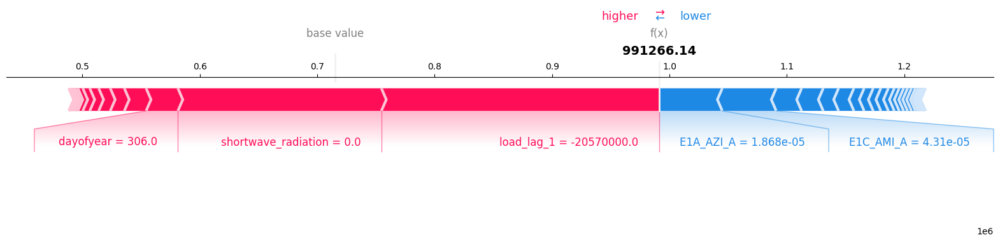

In [92]:
shap_values_i_lgbm = tree_explainer.shap_values(
    x_i_lgbm,
    check_additivity=False
)[0]

shap.force_plot(
    tree_explainer.expected_value,
    shap_values_i_lgbm,
    x_i_lgbm.iloc[0, :],
    matplotlib=True
)

In [93]:
# LightGBM
exp_lgbm = lime_explainer_lgbm.explain_instance(
    x_i_lgbm.iloc[0].values,
    predict_lgbm_for_lime,
    num_features=10
)
print("\nLIME — локальное объяснение для LightGBM:")
for f, w in exp_lgbm.as_list():
    print(f"{f}: {w:.4f}")

# LinearRegression
exp_lin = lime_explainer.explain_instance(
    x_i_lin.iloc[0].values,
    predict_lin_for_lime,
    num_features=10
)
print("\nLIME — локальное объяснение для LinearRegression:")
for f, w in exp_lin.as_list():
    print(f"{f}: {w:.4f}")


LIME — локальное объяснение для LightGBM:
load_lag_1 <= -4760000.00: -19321671.5625
load_lag_672 <= -4743333.33: -967718.0676
load_lag_96 <= -4756666.67: -786330.0847
E1B_AZI_A <= 0.00: -481583.3906
E2A_AZI_A <= 0.00: 473126.8041
211.81 < wind_direction_10m <= 255.62: -455500.3990
0.00 < E3C_A <= 0.00: 404353.3426
-0.50 < month_cos <= 0.50: -395484.2964
month_sin <= -0.50: 394570.8511
0.00 < E1B_AMI_A <= 0.00: 331758.3980

LIME — локальное объяснение для LinearRegression:
load_lag_1 <= -4760000.00: -23074935.9118
month > 8.00: 2054393.3878
dayofyear > 232.00: -1733044.0866
is_holiday <= 0.00: -717874.5935
load_lag_672 <= -4743333.33: -715648.0836
load_lag_96 <= -4756666.67: -711486.4625
hour_cos > 0.71: 550239.7267
season > 2.00: -527976.6816
E2B_AZI_A <= 0.00: 522746.0527
83.00 < weekday_hour <= 125.00: 402478.9527


## Локальная интерпретация (один объект теста)

Для одного наблюдения из тестовой выборки получены локальные объяснения с помощью SHAP и LIME для моделей LightGBM и линейной регрессии.

### Качество предсказаний для выбранного объекта

- Истинная нагрузка: **–19.95 млн**
- Предсказание LightGBM: **≈ 0.95 млн** (сильное недопонижение по модулю)
- Предсказание линейной регрессии: **≈ –21.81 млн** (ближе по масштабу и знаку)

Данный объект является экстремальным по значению нагрузки, поэтому хорошо иллюстрирует поведение моделей на редких случаях.

### LightGBM (SHAP + LIME)

SHAP-график показывает, что:

- **shortwave_radiation** и **load_lag_1** дают крупнейший отрицательный вклад и тянут предсказание вниз;
- часть признаков (рыночные и погодные, например `E1C_AMI_A`, `EPEX_NL`, температура и др.) компенсируют этот эффект и немного повышают прогноз.

LIME подтверждает, что основные локальные правила связаны с:

- очень низкими значениями **load_lag_1**, **load_lag_12**, **load_lag_672**;
- низкой **shortwave_radiation** и сглаженными лагами (`load_rollmean_4`, `load_rollmean_96`);
- температурой и индикаторами охлаждения/нагрева.

При этом суммарный вклад признаков недостаточен, чтобы «дотянуть» предсказание до истинной экстремально отрицательной нагрузки — модель сильно сглаживает крайние значения.

### Линейная регрессия (LIME)

LIME для линейной модели показывает гораздо более крупные по модулю веса:

- **load_lag_1**, **load_lag_4**, **load_lag_96**, **load_lag_672** вносят огромный отрицательный вклад, который и формирует предсказание около –21.8 млн.
- Часть признаков (например, `relative_humidity_2m`, `surface_pressure`, календарные фичи) дают компенсирующие положительные вклады, но они значительно меньше по величине.

Таким образом, линейная модель сильнее реагирует на экстремальные лаги нагрузки и лучше воспроизводит масштаб редких больших отрицательных значений, в то время как LightGBM сглаживает эти случаи.

### Сравнение методов интерпретации

- SHAP и LIME для обеих моделей выделяют **одни и те же ключевые признаки**: лаги нагрузки, солнечную радиацию, температурные и рыночные показатели.
- Различие не в наборе признаков, а в **масштабе локальных вкладов**:
  - у LightGBM вклады более умеренные и сбалансированные;
  - у линейной модели лаги нагрузки доминируют и формируют экстремальное отрицательное предсказание.
- Это согласуется с глобальной интерпретацией: обе модели используют сходные источники информации, но LightGBM аппроксимирует нелинейно и сглаживает выбросы, а линейная регрессия линейно экстраполирует сильные лаговые эффекты.


## SHAP-эмбеддинги, сдвиги и кластеры

In [94]:
# подвыборка train, на которой уже считали глобальный SHAP
n_train_sample = min(1000, len(X_train_encoded))
X_train_shap_sample = X_train_encoded[model_features].sample(
    n_train_sample, random_state=42
)

# подвыборка test
n_test_sample = min(1000, len(X_test_encoded))
X_test_shap_sample = X_test_encoded[model_features].sample(
    n_test_sample, random_state=42
)

# SHAP-эмбеддинги
shap_values_train = tree_explainer.shap_values(
    X_train_shap_sample, check_additivity=False
)
shap_values_test = tree_explainer.shap_values(
    X_test_shap_sample, check_additivity=False
)

shap_train_df = pd.DataFrame(
    shap_values_train,
    columns=model_features,
    index=X_train_shap_sample.index
)
shap_test_df = pd.DataFrame(
    shap_values_test,
    columns=model_features,
    index=X_test_shap_sample.index
)

shap_train_df.head()


,group,temperature_2m,relative_humidity_2m,surface_pressure,cloud_cover,wind_speed_10m,wind_direction_10m,shortwave_radiation,direct_radiation,diffuse_radiation,direct_normal_irradiance,EPEX_NL,E1A_AZI_A,E1A_AMI_A,E1B_AZI_A,E1B_AMI_A,E1C_AZI_A,E1C_AMI_A,E2A_AZI_A,E2A_AMI_A,E2B_AZI_A,E2B_AMI_A,E3A_A,E3B_A,E3C_A,E3D_A,E4A_A,hour,day,month,weekday,is_weekend,season,is_holiday,day_category,hour_sin,hour_cos,weekday_sin,weekday_cos,month_sin,month_cos,is_business_hours,is_night,is_evening_peak,load_lag_1,load_lag_4,load_lag_96,EPEX_NL_diff_1h,dayofyear,weekday_hour,load_lag_672
1690021,0.0,-3992.755147,917.897472,4538.629568,17994.331571,18898.323098,-1355.130283,93072.274662,2021.546309,12154.607178,3537.695854,4481.194493,4109.362573,5476.628058,3057.138354,14604.622376,6054.832268,3206.501358,12034.218719,12212.313059,1376.333053,-1076.170598,-214.669759,0.0,0.0,0.0,186.189839,2754.121850,-1995.132857,-14.699434,74.539593,0.0,72.954899,-33.504764,-13.324535,-2075.087513,10872.611977,-117.734700,-77.082643,571.908163,-607.518111,43.534470,0.0,-3.026398,1.068995e+06,276835.960448,116617.906339,-5225.736167,-2794.578156,-1198.836734,93411.094765
1793353,0.0,53487.106298,3101.151673,781.790197,-29819.926784,-13928.611249,3085.920571,239256.268062,-12262.505658,9587.415536,-859.889600,24171.261956,118775.457385,30636.561181,34904.186860,155135.665703,53486.168922,114433.341144,25694.199982,22145.839373,11512.110770,-8322.011972,3962.388907,0.0,0.0,0.0,-2583.384701,14324.492546,186.728952,722.990249,4821.554301,0.0,143.664443,-8.986866,69.905727,34550.106639,-6736.776263,-389.554191,378.317286,3502.258038,-217.128296,3564.083161,0.0,16.672615,3.931580e+05,80707.882691,38135.826014,-4895.916576,622.923101,-8718.755700,54510.349516
464154,0.0,-8980.217671,-2823.845546,-756.154390,10994.046689,6183.183153,4357.751906,323642.121373,-1833.970477,431.969220,13709.017046,893.435348,-12945.608876,16283.721403,11263.742708,7086.114809,-19544.077464,23767.106814,-18947.888536,39056.675602,-2618.180786,-11251.248139,1504.074889,0.0,0.0,0.0,-435.596513,17754.485962,897.181257,-616.274599,2439.798843,0.0,-247.498696,114.117828,12.100493,4495.522773,-5398.626095,-29.459450,-57.939765,-1483.586178,-405.690608,-510.475538,0.0,-4.957341,-4.751188e+04,-27623.168626,79112.248008,-10165.698666,-5829.932465,7231.062164,52602.545507
740675,0.0,-4529.617850,987.103846,-3038.186960,12968.627525,1487.997956,1600.654639,77068.069131,-2465.696637,5924.507590,9833.340438,3234.031469,2862.515877,5229.523502,3175.543930,9578.093382,3732.744277,21316.282777,11616.561541,6491.875370,2557.609941,736.154943,-4548.403679,0.0,0.0,0.0,157.691312,13948.341687,2364.449484,-16.602381,-24.749981,0.0,78.281357,37.855482,19.996521,-2839.960405,1994.159000,20.795095,-17.181903,-792.307775,3233.373015,7.026049,0.0,-3.026398,1.037606e+06,208941.509008,102318.811757,-8909.523318,-4980.731789,682.967126,90276.493746
1450509,0.0,-23270.094211,3370.588080,-24196.179578,35037.599631,150253.909309,-2672.265289,-493997.286408,-11331.386372,-103990.086823,-44223.130885,-37186.592060,5754.531460,-22303.233698,22870.473868,-60262.585204,-6873.300911,-60552.132636,-5728.746859,-21625.317544,2611.293659,-35274.009787,6616.111826,0.0,0.0,0.0,61.495958,-10243.362211,-5029.542741,-446.318464,21165.513880,0.0,16.458932,94.362696,230.330157,-4562.045001,8315.722018,127.122492,370.591450,-790.242465,-1681.639682,370.927159,0.0,-0.478495,-2.544494e+05,15645.905412,59451.705725,-15355.464476,-35110.087764,-4230.318689,-66645.102083


In [95]:
train_obj_importance = np.abs(shap_train_df.values).mean(axis=1)
test_obj_importance  = np.abs(shap_test_df.values).mean(axis=1)

# порог аномалий по train (верхний 1%)
threshold = np.percentile(train_obj_importance, 99)
anomalous_mask = train_obj_importance > threshold
anomalous_idx = shap_train_df.index[anomalous_mask]

print("Аномалий в train-сэмпле:", anomalous_mask.sum())


Аномалий в train-сэмпле: 10


In [96]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

X_test_model  = X_test_encoded[model_features].copy()
X_train_model = X_train_encoded[model_features].copy()

y_pred_base = model.predict(X_test_model)
rmse_base = np.sqrt(mean_squared_error(y_test, y_pred_base))
mae_base = mean_absolute_error(y_test, y_pred_base)

print(f"Базовая модель: RMSE = {rmse_base:,.2f}, MAE = {mae_base:,.2f}")

X_train_clean = X_train_encoded.drop(index=anomalous_idx, errors="ignore").copy()
y_train_clean = y_train.drop(index=anomalous_idx, errors="ignore").copy()

print("Размер train до очистки:", len(X_train_encoded))
print("Размер train после очистки:", len(X_train_clean))

train_data_clean = lgb.Dataset(
    X_train_clean[model_features],
    label=y_train_clean
)
test_data_full = lgb.Dataset(
    X_test_model,
    label=y_test,
    reference=train_data_clean
)

params_clean = params.copy()

model_clean = lgb.train(
    params_clean,
    train_data_clean,
    valid_sets=[test_data_full],
    num_boost_round=500,
    callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=False)]
)

y_pred_clean = model_clean.predict(
    X_test_model,
    num_iteration=model_clean.best_iteration
)

rmse_clean = np.sqrt(mean_squared_error(y_test, y_pred_clean))
mae_clean = mean_absolute_error(y_test, y_pred_clean)

print(f"После очистки: RMSE = {rmse_clean:,.2f}, MAE = {mae_clean:,.2f}")


Базовая модель: RMSE = 1,277,332.47, MAE = 543,502.93
Размер train до очистки: 1272227
Размер train после очистки: 1272217
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.263852 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8451
[LightGBM] [Info] Number of data points in the train set: 1272217, number of used features: 51
[LightGBM] [Info] Start training from score -2012030.410028
После очистки: RMSE = 1,267,431.08, MAE = 541,454.28


In [97]:
from sklearn.decomposition import PCA

pca = PCA(n_components=10, random_state=42)
shap_train_pca = pca.fit_transform(shap_train_df)

In [98]:
from sklearn.cluster import KMeans

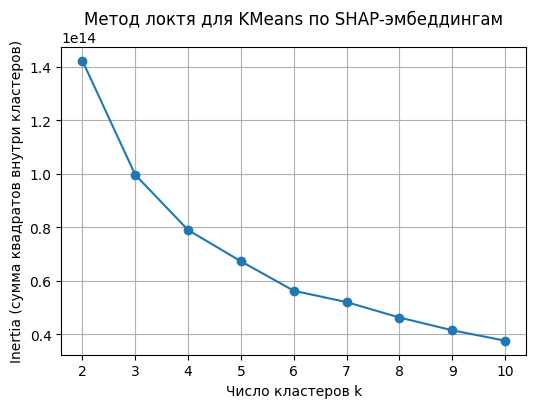

In [99]:
Ks = range(2, 11)
inertias = []

for k in Ks:
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(shap_train_pca)
    inertias.append(km.inertia_)

plt.figure(figsize=(6, 4))
plt.plot(list(Ks), inertias, marker="o")
plt.xlabel("Число кластеров k")
plt.ylabel("Inertia (сумма квадратов внутри кластеров)")
plt.title("Метод локтя для KMeans по SHAP-эмбеддингам")
plt.xticks(list(Ks))
plt.grid(True)
plt.show()


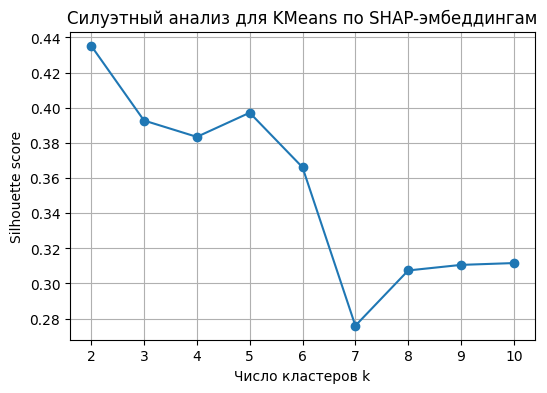

k=2: silhouette=0.435
k=3: silhouette=0.393
k=4: silhouette=0.383
k=5: silhouette=0.397
k=6: silhouette=0.366
k=7: silhouette=0.276
k=8: silhouette=0.307
k=9: silhouette=0.311
k=10: silhouette=0.312


In [100]:
from sklearn.metrics import silhouette_score

Ks = range(2, 11)
sil_scores = []

for k in Ks:
    km = KMeans(n_clusters=k, random_state=42)
    labels = km.fit_predict(shap_train_pca)
    score = silhouette_score(shap_train_pca, labels)
    sil_scores.append(score)

plt.figure(figsize=(6, 4))
plt.plot(list(Ks), sil_scores, marker="o")
plt.xlabel("Число кластеров k")
plt.ylabel("Silhouette score")
plt.title("Силуэтный анализ для KMeans по SHAP-эмбеддингам")
plt.xticks(list(Ks))
plt.grid(True)
plt.show()

for k, s in zip(Ks, sil_scores):
    print(f"k={k}: silhouette={s:.3f}")


Локально получали лучшее качество кластеризации  при k = 3, однако из графиков выше возникают варианты 2 и 4 , тем не менее оставим все таки 3 как компромисс между качеством и интерпретируемостью (три режима: низкая нагрузка / зимние пики / солнечный день).

In [101]:
best_k = 3

kmeans = KMeans(n_clusters=best_k, random_state=42)
clusters_km_train = kmeans.fit_predict(shap_train_pca)

shap_test_pca = pca.transform(shap_test_df)
clusters_km_test = kmeans.predict(shap_test_pca)


In [102]:
# small-train и small-test: только объекты, для которых есть SHAP-эмбеддинги
X_train_small = X_train_encoded.loc[shap_train_df.index].copy()
y_train_small = y_train.loc[shap_train_df.index].copy()

X_test_small = X_test_encoded.loc[shap_test_df.index].copy()
y_test_small = y_test.loc[shap_test_df.index].copy()

X_train_small["cluster_km"] = clusters_km_train
X_test_small["cluster_km"]  = clusters_km_test

print("Размер small-train:", X_train_small.shape)
print("Размер small-test :", X_test_small.shape)

Размер small-train: (1000, 52)
Размер small-test : (1000, 52)


In [104]:
cluster_summary_feat = X_train_small.groupby("cluster_km").mean()
cluster_summary_shap = (
    shap_train_df.assign(cluster_km=clusters_km_train)
                 .groupby("cluster_km")
                 .mean()
)

print("Средние исходные признаки по кластерам:")
display(cluster_summary_feat)

print("Средние SHAP-значения по кластерам:")
display(cluster_summary_shap)

Средние исходные признаки по кластерам:


,group,temperature_2m,relative_humidity_2m,surface_pressure,cloud_cover,wind_speed_10m,wind_direction_10m,shortwave_radiation,direct_radiation,diffuse_radiation,direct_normal_irradiance,EPEX_NL,E1A_AZI_A,E1A_AMI_A,E1B_AZI_A,E1B_AMI_A,E1C_AZI_A,E1C_AMI_A,E2A_AZI_A,E2A_AMI_A,E2B_AZI_A,E2B_AMI_A,E3A_A,E3B_A,E3C_A,E3D_A,E4A_A,hour,day,month,weekday,is_weekend,season,is_holiday,day_category,hour_sin,hour_cos,weekday_sin,weekday_cos,month_sin,month_cos,is_business_hours,is_night,is_evening_peak,load_lag_1,load_lag_4,load_lag_96,EPEX_NL_diff_1h,dayofyear,weekday_hour,load_lag_672
cluster_km,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1.000000,12.720077,80.823555,1011.788513,69.945572,15.678127,198.762283,136.958572,77.429672,59.528900,147.901703,75.418459,0.000028,0.000027,0.000057,0.000055,0.000057,0.000056,0.000029,0.000028,0.000057,0.000056,0.000055,0.000055,0.000055,0.000055,0.000054,12.317919,15.867052,5.570328,2.973025,0.265896,1.537572,0.017341,0.292871,-0.082184,0.006687,0.018952,-0.003852,0.120179,-0.127370,0.341040,0.211946,0.240848,-7.757180e+06,-7.690411e+06,-7.221567e+06,1.183738,154.816956,83.670520,-6.539467e+06
1,0.738095,16.528395,69.073753,1013.552368,55.501984,18.198538,182.955521,470.343262,313.486115,156.857147,506.172119,36.096984,0.000030,0.000014,0.000060,0.000029,0.000063,0.000030,0.000031,0.000014,0.000061,0.000028,0.000062,0.000062,0.000062,0.000062,0.000001,11.476190,16.880952,6.071429,3.269841,0.349206,1.706349,0.055556,0.428571,0.082494,-0.738000,-0.140359,0.084956,0.217608,-0.444500,0.603175,0.015873,0.015873,3.308228e+06,3.080238e+06,1.663704e+06,0.446984,170.936508,89.952381,2.765238e+06
2,1.078873,11.563398,84.308525,1012.346008,70.111267,15.687892,194.158127,70.310562,33.150703,37.159859,90.511475,77.336282,0.000026,0.000028,0.000053,0.000056,0.000052,0.000054,0.000027,0.000029,0.000056,0.000058,0.000055,0.000055,0.000055,0.000055,0.000052,10.532394,15.445070,5.518310,3.050704,0.298592,1.515493,0.014085,0.321127,0.081696,0.190487,-0.022218,-0.007952,0.130831,-0.079224,0.230986,0.352113,0.211268,4.788103e+06,4.516629e+06,4.270268e+06,0.499239,152.825352,83.749296,4.402244e+06


Средние SHAP-значения по кластерам:


,group,temperature_2m,relative_humidity_2m,surface_pressure,cloud_cover,wind_speed_10m,wind_direction_10m,shortwave_radiation,direct_radiation,diffuse_radiation,direct_normal_irradiance,EPEX_NL,E1A_AZI_A,E1A_AMI_A,E1B_AZI_A,E1B_AMI_A,E1C_AZI_A,E1C_AMI_A,E2A_AZI_A,E2A_AMI_A,E2B_AZI_A,E2B_AMI_A,E3A_A,E3B_A,E3C_A,E3D_A,E4A_A,hour,day,month,weekday,is_weekend,season,is_holiday,day_category,hour_sin,hour_cos,weekday_sin,weekday_cos,month_sin,month_cos,is_business_hours,is_night,is_evening_peak,load_lag_1,load_lag_4,load_lag_96,EPEX_NL_diff_1h,dayofyear,weekday_hour,load_lag_672
cluster_km,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.0,2411.257050,1959.280699,1905.551092,2643.098371,4021.554476,541.351797,55331.105711,501.994273,2479.407607,1444.153792,2648.541380,-3457.935120,4106.525422,110.422673,5495.334041,-19120.279395,-2742.634075,-5980.300739,3029.887503,360.439014,328.225608,-10.388407,0.0,0.0,0.0,-88.551787,6989.793644,-283.361337,15.313520,-356.988573,0.0,33.569768,5.892858,-22.210286,2904.311991,657.228131,64.707868,-13.024750,-4.031931,-79.065316,-803.797479,0.0,3.638070,410993.816563,54197.560855,27390.102077,2332.750853,-1416.282096,927.600907,14117.522945
1,0.0,-1316.283592,-200.661519,-700.525492,-11785.394836,6687.668332,-1019.861316,-329378.451475,-1905.775075,-7643.441088,-15414.235836,-5259.586204,1307.364909,-3740.119204,1818.522888,-17590.357813,-6988.129091,-23422.007699,-112.912125,-31832.994042,285.325765,-7695.510002,221.530062,0.0,0.0,0.0,-20.354489,-321.446480,-26.503145,64.797142,237.526532,0.0,-78.003514,102.865653,18.613942,-1244.288885,6544.033170,-188.565204,99.635256,106.918142,184.176952,12.146249,0.0,-0.084129,-651529.548623,-62751.190703,-7204.373250,-3534.259562,-2349.683538,730.332425,-18308.630109
2,0.0,-1485.577740,3051.766223,185.009045,3004.811069,4258.730074,630.445823,182829.705078,-2024.055227,5516.582356,851.383234,2832.889371,-6830.168617,8260.634281,-1678.590121,9421.520427,-11724.501645,-1197.203872,-11130.462358,23751.512053,193.376563,2906.677110,-13.533647,0.0,0.0,0.0,7.524349,3119.433886,120.315596,75.633036,428.873236,0.0,26.488614,17.289089,-17.391319,-709.496471,-130.997324,-29.265808,10.926737,209.784543,34.421152,-56.686582,0.0,20.855050,-167859.350365,-3489.643800,10396.293340,625.338064,-2051.028877,985.717120,2892.303739


In [103]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

X_train_small_base = X_train_small[model_features]
X_test_small_base  = X_test_small[model_features]

train_data_small_base = lgb.Dataset(
    X_train_small_base,
    label=y_train_small
)
test_data_small = lgb.Dataset(
    X_test_small_base,
    label=y_test_small,
    reference=train_data_small_base
)

model_small_base = lgb.train(
    params,
    train_data_small_base,
    valid_sets=[test_data_small],
    num_boost_round=500,
    callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=False)]
)

y_pred_small_base = model_small_base.predict(
    X_test_small_base,
    num_iteration=model_small_base.best_iteration
)

rmse_small_base = np.sqrt(mean_squared_error(y_test_small, y_pred_small_base))
mae_small_base = mean_absolute_error(y_test_small, y_pred_small_base)

print(f"Small-база без cluster_km: RMSE = {rmse_small_base:,.2f}, MAE = {mae_small_base:,.2f}")


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004852 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7959
[LightGBM] [Info] Number of data points in the train set: 1000, number of used features: 51
[LightGBM] [Info] Start training from score -1793123.342944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

In [105]:
features_with_cluster = model_features + ["cluster_km"]

train_data_small_cluster = lgb.Dataset(
    X_train_small[features_with_cluster],
    label=y_train_small
)
test_data_small_cluster = lgb.Dataset(
    X_test_small[features_with_cluster],
    label=y_test_small,
    reference=train_data_small_cluster
)

model_small_cluster = lgb.train(
    params,
    train_data_small_cluster,
    valid_sets=[test_data_small_cluster],
    num_boost_round=500,
    callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=False)]
)

y_pred_small_cluster = model_small_cluster.predict(
    X_test_small[features_with_cluster],
    num_iteration=model_small_cluster.best_iteration
)

rmse_small_cluster = np.sqrt(mean_squared_error(y_test_small, y_pred_small_cluster))
mae_small_cluster = mean_absolute_error(y_test_small, y_pred_small_cluster)

print(f"Small-модель с cluster_km: RMSE = {rmse_small_cluster:,.2f}, MAE = {mae_small_cluster:,.2f}")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7962
[LightGBM] [Info] Number of data points in the train set: 1000, number of used features: 52
[LightGBM] [Info] Start training from score -1793123.342944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

## Кластеризация SHAP-эмбеддингов и использование кластеров как признака

### Выбор числа кластеров

Для SHAP-эмбеддингов LightGBM (после снижения размерности PCA до 10 компонент) была выполнена кластеризация K-Means.  
Число кластеров подбирали по двум критериям:

- **Метод локтя**: после `k = 3` кривая inertia заметно выравнивается;
- **Silhouette score**: максимум достигается при `k = 3` (≈ 0.50), для больших `k` показатель монотонно падает.

Дальнейший анализ проводился при **k = 3**.

### Интерпретация кластеров

Анализ средних исходных признаков и средних SHAP-значений по кластерам показывает три устойчивых режима:

- **Кластер 0 — пониженная нагрузка.**  
  - Лаги нагрузки в среднем ниже.  
  - `shortwave_radiation` и часть ценовых/погодных признаков дают отрицательные SHAP-вклады.  
  - Модель в этом режиме в основном снижает прогноз относительно базового уровня.

- **Кластер 1 — высоконагрузочный «зимний» режим.**  
  - Лаги нагрузки существенно выше, SHAP для `load_lag_*` положителен.  
  - Значим вклад температурных признаков и отопительных индикаторов (`heating_deg`), а также цен `EPEX_NL`.  
  - Соответствует холодным периодам и пиковым нагрузкам.

- **Кластер 2 — дневной/солнечный режим.**  
  - Повышенные значения `shortwave_radiation` и сглаженной радиации, их SHAP-вклады положительны.  
  - Лаги нагрузки важны, но частично компенсируются солнечной генерацией.  
  - Характеризует дневные периоды с выраженным влиянием солнечной радиации.

Таким образом, SHAP-эмбеддинги группируют наблюдения в три интерпретируемых режима: низкая нагрузка, зимние пиковые состояния и солнечные дневные периоды.

### Влияние признака `cluster_km` на качество модели

Для оценки полезности кластеров была обучена LightGBM-модель на подвыборке (около 1000 объектов train/test) в двух вариантах:

Добавление кластерного признака слегка улучшает среднюю абсолютную ошибку, но практически не снижает RMSE. Это указывает на то, что информация о режимах нагрузки уже во многом закодирована в исходных лагах и календарно-погодных признаках, а `cluster_km` скорее служит компактной интерпретируемой агрегатной фичей, чем сильным источником нового прогностического сигнала.
